In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from glob import glob
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

##Import any other packages you may need here
import matplotlib.image as mpimg
import pydicom
from collections import Counter
import scipy

EDA is open-ended, and it is up to you to decide how to look at different ways to slice and dice your data. A good starting point is to look at the requirements for the FDA documentation in the final part of this project to guide (some) of the analyses you do. 

This EDA should also help to inform you of how pneumonia looks in the wild. E.g. what other types of diseases it's commonly found with, how often it is found, what ages it affects, etc. 

Note that this NIH dataset was not specifically acquired for pneumonia. So, while this is a representation of 'pneumonia in the wild,' the prevalence of pneumonia may be different if you were to take only chest x-rays that were acquired in an ER setting with suspicion of pneumonia. 

Perform the following EDA:
* The patient demographic data such as gender, age, patient position,etc. (as it is available)
* The x-ray views taken (i.e. view position)
* The number of cases including: 
    * number of pneumonia cases,
    * number of non-pneumonia cases
* The distribution of other diseases that are comorbid with pneumonia
* Number of disease per patient 
* Pixel-level assessments of the imaging data for healthy & disease states of interest (e.g. histograms of intensity values) and compare distributions across diseases.

Note: use full NIH data to perform the first a few EDA items and use `sample_labels.csv` for the pixel-level assassements. 

Also, **describe your findings and how will you set up the model training based on the findings.**

In [2]:
## Below is some helper code to read data for you.
## Load NIH data
all_xray_df = pd.read_csv('/data/Data_Entry_2017.csv')
all_xray_df.sample(3)

## Load 'sample_labels.csv' data for pixel level assessments
sample_df = pd.read_csv('sample_labels.csv')
sample_df.sample(3)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
746,00003900_000.png,No Finding,0,3900,059Y,F,PA,2678,2991,0.143,0.143
1392,00007216_000.png,No Finding,0,7216,038Y,F,PA,2048,2500,0.171,0.171
982,00005107_000.png,Nodule,0,5107,044Y,F,PA,2048,2500,0.171,0.171


In [3]:
## EDA
# Todo 
all_xray_df.head() 

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


In [4]:
len(sample_df)

5606

### Split Finding labels column in to column for eache deceses

In [5]:
#split 'column 'Finding labels'
finding_labels = set('|'.join(all_xray_df['Finding Labels']).split('|'))
#sort the labels for easier readings
finding_labels = sorted(finding_labels)
for label in finding_labels:
  all_xray_df[label] = all_xray_df['Finding Labels'].apply(lambda x: 1 if label in x else 0)
#drop usless columm 
all_xray_df = all_xray_df.drop(['Unnamed: 11'],axis=1)

In [6]:
for label in finding_labels:
    sample_df[label] = sample_df['Finding Labels'].apply(lambda x: 1 if label in x else 0)

# 1 The patient demographic data such as gender, age, patient position,etc.

## 1.1 Age distribution

In [7]:
selected_columns = finding_labels.copy()
selected_columns.append('Patient Age')

In [8]:
## check for extrame values 
all_xray_df[all_xray_df['Patient Age']>120]

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
20852,00005567_000.png,Effusion|Pneumonia,0,5567,412,M,AP,3056,2544,0.139,...,0,0,0,0,0,0,0,0,1,0
46965,00011973_002.png,Edema,2,11973,414,M,AP,3056,2544,0.139,...,0,0,0,0,0,0,0,0,0,0
48284,00012238_010.png,No Finding,10,12238,148,M,PA,2992,2991,0.143,...,0,0,0,0,0,1,0,0,0,0
55742,00013950_000.png,No Finding,0,13950,148,M,PA,2964,2939,0.143,...,0,0,0,0,0,1,0,0,0,0
58650,00014520_026.png,Infiltration|Mass,26,14520,150,M,PA,2992,2991,0.143,...,0,0,0,1,1,0,0,0,0,0
62929,00015558_000.png,No Finding,0,15558,149,M,PA,2992,2991,0.143,...,0,0,0,0,0,1,0,0,0,0
74884,00018366_044.png,Pneumothorax,44,18366,152,F,PA,2302,2991,0.143,...,0,0,0,0,0,0,0,0,0,1
78795,00019346_000.png,Infiltration,0,19346,151,F,PA,2678,2774,0.143,...,0,0,0,1,0,0,0,0,0,0
84810,00020900_002.png,No Finding,2,20900,411,M,AP,3056,2544,0.139,...,0,0,0,0,0,1,0,0,0,0
85404,00021047_002.png,Mass|Pleural_Thickening,2,21047,412,M,AP,3056,2544,0.139,...,0,0,0,0,1,0,0,1,0,0


In [9]:
### for the EDA , we will clean wrong input , but it might be that further for the image training we use some of this records if needed because they are the erro is at input level

In [10]:
#clean wrong inputs
all_xray_df = all_xray_df[all_xray_df['Patient Age']<=120]
print(len(all_xray_df))

112104


### 1.1.1 General data distribution by age

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  


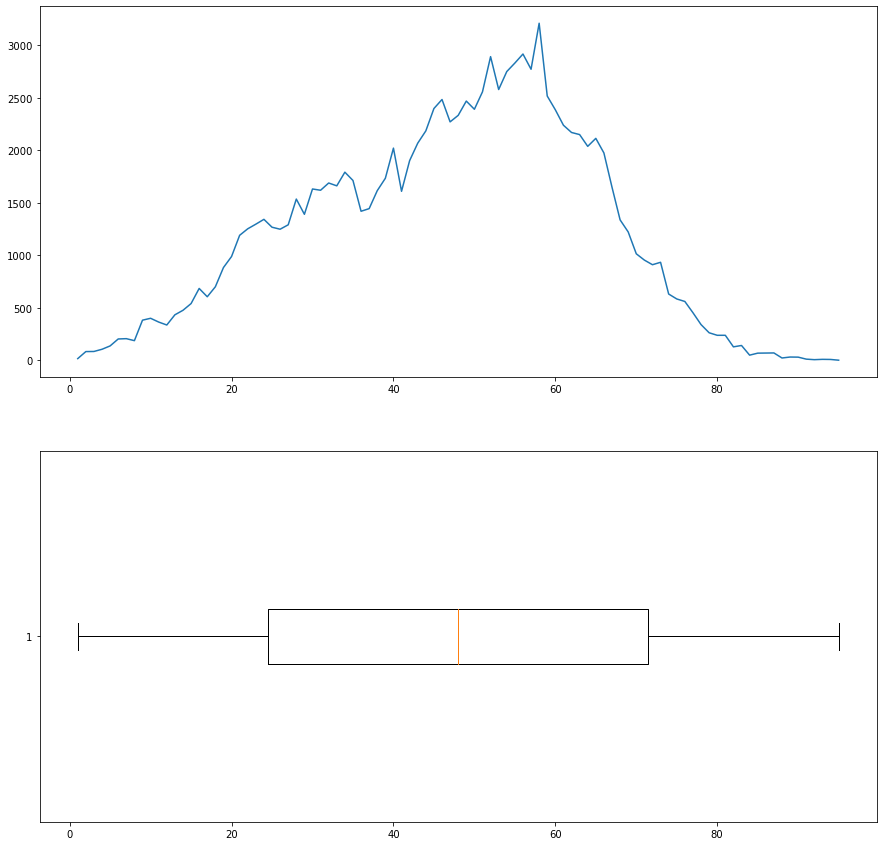

In [11]:
all_xray_by_age_df = all_xray_df.pivot_table(values='Pneumonia',index='Patient Age',aggfunc ='count')
all_xray_by_age_df = all_xray_by_age_df.reset_index().rename(columns={'Patient Age':'age'})
fig,ax = plt.subplots(2,1,figsize=(15,15))
ax[0].plot(all_xray_by_age_df['age'],all_xray_by_age_df['Pneumonia'])
ax[1].boxplot([all_xray_by_age_df['age']],vert=False)
ax[1].set_yticks([1],['age'])

### 1.1.2 Distribution per decease or not per age

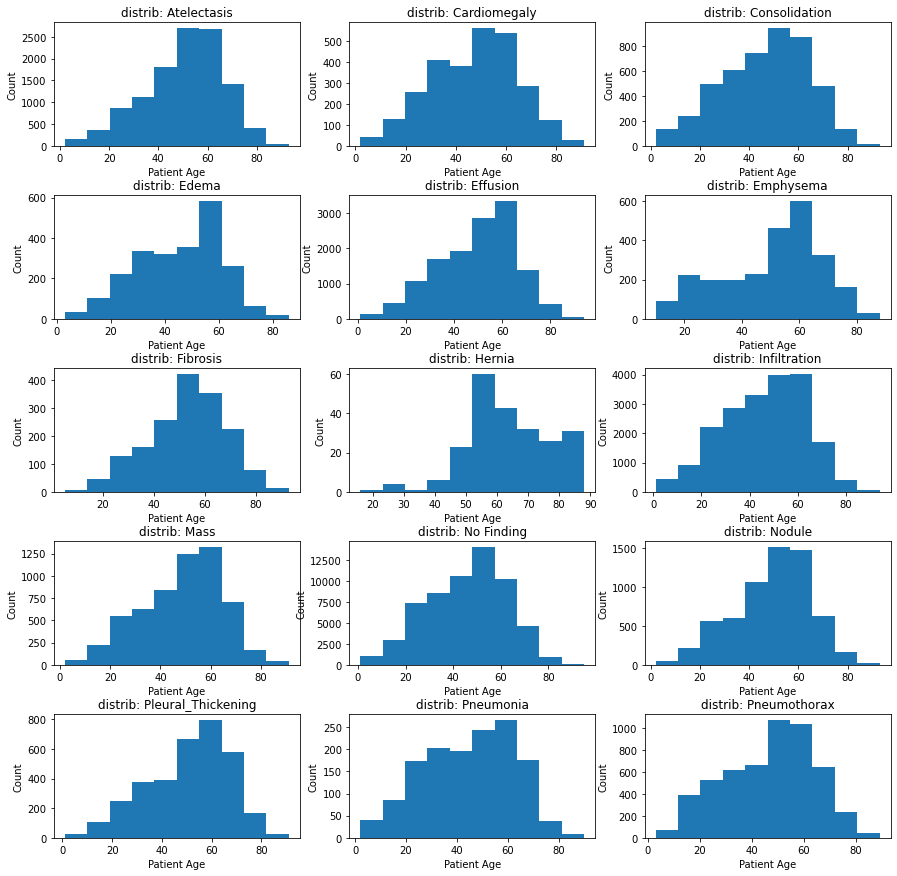

In [12]:
i=0
j = 0
fig, ax = plt.subplots(5,3,figsize= (15,15))
for decease in finding_labels:    
   ax[i,j].hist(all_xray_df[all_xray_df[decease]==1]['Patient Age'])
   title = f'distrib: {decease}'
   ax[i,j].set_title(title)
   ax[i,j].set_xlabel('Patient Age')
   ax[i,j].set_ylabel('Count')
   j=(j+1)%3
   if j==0:
       fig.subplots_adjust(hspace=0.4) 
       i+=1

### 1.1.3 Detail Pneumonia distribution per age

In [13]:
#values='Value', index='Age', aggfunc='sum')
pneumonia_xray_by_age_df = all_xray_df.pivot_table(values='Pneumonia',index='Patient Age', aggfunc='sum')

In [14]:
pxba=pneumonia_xray_by_age_df.reset_index()
pxba = pxba.rename(columns={'Patient Age':'age'})

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Passing the minor parameter of set_yticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  after removing the cwd from sys.path.


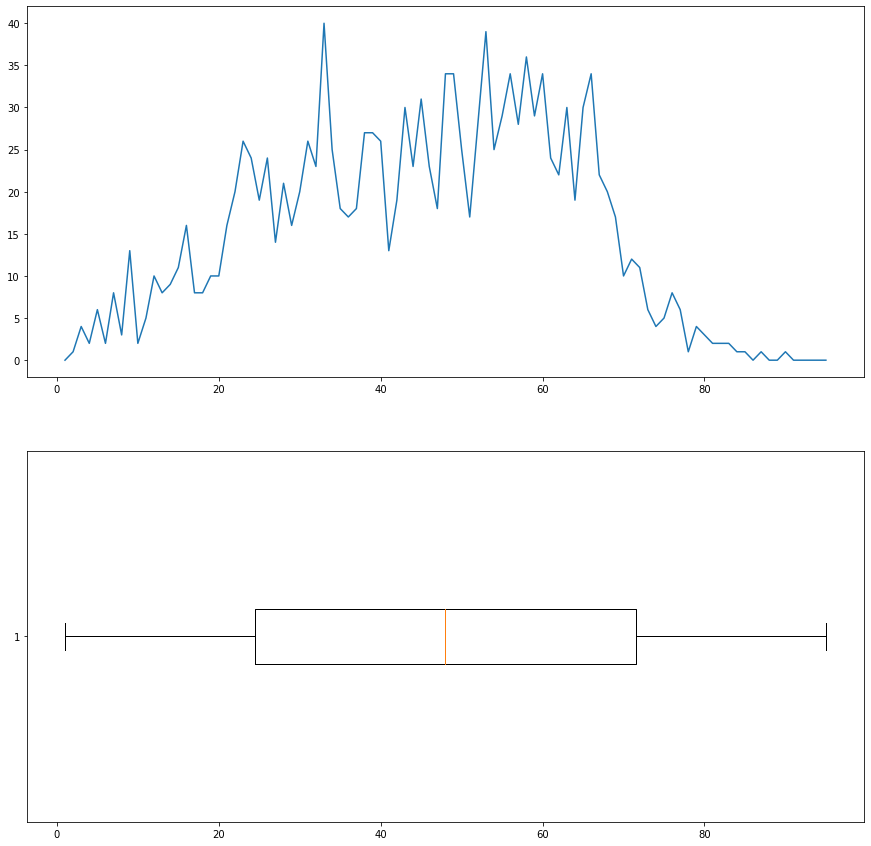

In [15]:
fig,ax = plt.subplots(2,1,figsize=(15,15))
ax[0].plot(pxba['age'],pxba['Pneumonia'])
ax[1].boxplot([pxba['age']],vert=False)
ax[1].set_yticks([1],['age'])

# 1.2 Gender distribution

In [16]:
selected_columns = finding_labels.copy()
selected_columns.append('Patient Gender')

In [17]:
decease_by_gender= all_xray_df.groupby('Patient Gender')[selected_columns].sum().reset_index()

In [18]:
decease_by_gender

,Patient Gender,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
0,F,4653,1469,2001,1099,5882,906,771,131,8466,2253,26437,2646,1343,593,2584
1,M,6905,1307,2666,1203,7434,1610,915,96,11425,3526,33916,3685,2041,837,2717


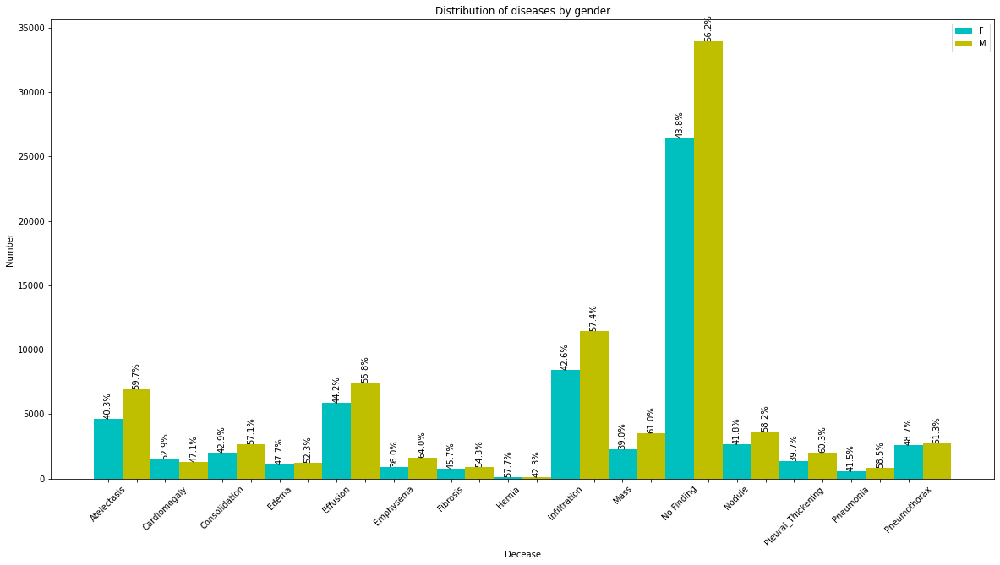

Max delta 28.0% more woman for some decease
Min delta -15.4% less woman for some decease


In [19]:
#plt.bar(decease_by_gender.index,decease_by_gender['Atelectasis'])
bar_width =.5
x = np.arange(len(decease_by_gender['Patient Gender']))
positions = []
labels = []
delta_ratios = []
fig,ax = plt.subplots(figsize=(20,10))
plt.xlabel('Decease')
plt.ylabel('Number')
n= len(selected_columns)
colors = ['c','y']
labels = []
offset = 0
for i,col in enumerate(finding_labels):
    tot = decease_by_gender.loc[0][col] + decease_by_gender.loc[1][col]
    delta=0
    for j in range(2):    
        val = decease_by_gender.loc[j][col]
        positions.append(offset)
        bc = ax.bar(offset,val,width=bar_width,tick_label=col,color=colors[j])
        bc.set_label(label)
        for bar in bc:
            ratio = val/tot*100
            ax.text(bar.get_x() + bar.get_width()/2,bar.get_height(), f'{ratio:.1f}%',ha='center',va='bottom',rotation='vertical')
        offset+=1*bar_width
        if j==0:
            delta = delta -ratio
        elif j==1:    
            delta=delta +ratio
    labels.append(col)
    labels.append('')
    delta_ratios.append(delta)     
plt.title('Distribution of diseases by gender')
plt.xticks(positions,labels,rotation=45)
ax.legend(['F','M'])
plt.show()
print(f'Max delta {(max(delta_ratios)):.1f}% more woman for some decease')
print(f'Min delta {(min(delta_ratios)):.1f}% less woman for some decease')  

### We see some imbalance toward deceased woman except for Edema
- The max delta  = 28% for decease between men and woman
- The not weighted mean for deceases between man and woman is 11%, we sees also that we have a delta of 13% between men and woman in the dataset  
The outcome will be
- For needed unbalanced deceases with low number of data, I 'll not take care of of the gender. 
- For other data with high number of data , I will reduce the data to be balanced.


In [20]:
woman_number  =  len(all_xray_df[all_xray_df['Patient Gender']=='F'])
men_number = len(all_xray_df[all_xray_df['Patient Gender']=='M'])
tot = woman_number + men_number
ratio_men = men_number/len(all_xray_df)*100
ratio_woman = woman_number/len(all_xray_df)*100
delta = ratio_men - ratio_woman

print(f'Max delta {abs(max(delta_ratios)):.1f}% more woman with decease')
print(f'Min delta {abs(min(delta_ratios)):.1f}% less woman with decease')    
print(f'Delta mean: {np.mean(delta_ratios):.1f}')
print(f'Within data : ratio woman: {ratio_woman:.1f}%, ratio men: {ratio_men:.1f}% delta = {delta:.1f}')

Max delta 28.0% more woman with decease
Min delta 15.4% less woman with decease
Delta mean: 11.4
Within data : ratio woman: 43.5%, ratio men: 56.5% delta = 13.0


## 1.3 Patient position distribution

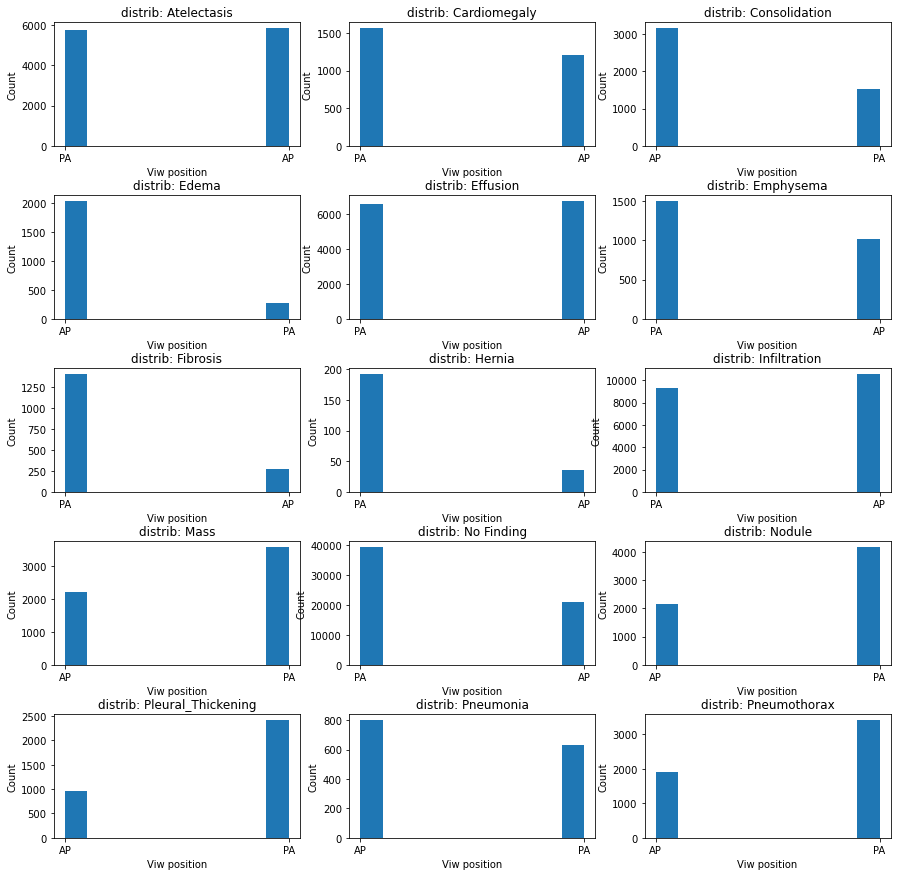

In [21]:
i=0
j = 0
fig, ax = plt.subplots(5,3,figsize= (15,15))
for decease in finding_labels:    
   ax[i,j].hist(all_xray_df[all_xray_df[decease]==1]['View Position'])
   title = f'distrib: {decease}'
   ax[i,j].set_title(title)
   ax[i,j].set_xlabel('Viw position')
   ax[i,j].set_ylabel('Count')
   j=(j+1)%3
   if j==0:
       fig.subplots_adjust(hspace=0.4) 
       i+=1

# 2 The x.ray views taken (.e view position)

## 2.0 Preparation image access

In [22]:
all_image_paths = {os.path.basename(x): x for x in 
                   glob(os.path.join('/data','images*', '*', '*.png'))}

print('Scans found:', len(all_image_paths), ', Total Headers',sample_df.shape[0])
sample_df['path']= sample_df['Image Index'].map(all_image_paths)
sample_df

Scans found: 112120 , Total Headers 5606


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,...,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax,path
0,00000013_005.png,Emphysema|Infiltration|Pleural_Thickening|Pneu...,5,13,060Y,M,AP,3056,2544,0.139000,...,0,0,1,0,0,0,1,0,1,/data/images_001/images/00000013_005.png
1,00000013_026.png,Cardiomegaly|Emphysema,26,13,057Y,M,AP,2500,2048,0.168000,...,0,0,0,0,0,0,0,0,0,/data/images_001/images/00000013_026.png
2,00000017_001.png,No Finding,1,17,077Y,M,AP,2500,2048,0.168000,...,0,0,0,0,1,0,0,0,0,/data/images_001/images/00000017_001.png
3,00000030_001.png,Atelectasis,1,30,079Y,M,PA,2992,2991,0.143000,...,0,0,0,0,0,0,0,0,0,/data/images_001/images/00000030_001.png
4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,055Y,F,AP,2500,2048,0.168000,...,0,0,0,0,0,0,0,0,0,/data/images_001/images/00000032_001.png
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5601,00030712_000.png,No Finding,0,30712,058Y,M,PA,2021,2021,0.194311,...,0,0,0,0,1,0,0,0,0,/data/images_012/images/00030712_000.png
5602,00030786_005.png,Cardiomegaly|Effusion|Emphysema,5,30786,061Y,F,AP,3056,2544,0.139000,...,0,0,0,0,0,0,0,0,0,/data/images_012/images/00030786_005.png
5603,00030789_000.png,Infiltration,0,30789,052Y,F,PA,2021,2021,0.194311,...,0,0,1,0,0,0,0,0,0,/data/images_012/images/00030789_000.png
5604,00030792_000.png,No Finding,0,30792,010Y,F,PA,1775,1712,0.194311,...,0,0,0,0,1,0,0,0,0,/data/images_012/images/00030792_000.png


## 2.1 Pure pneumonia case


display pneumonia sample 14
Index: 1631, decease: Pneumonia, path: /data/images_004/images/00008470_008.png, view: AP 
Image (1024, 1024)


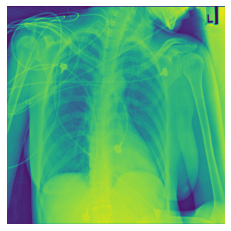

Index: 2286, decease: Pneumonia, path: /data/images_006/images/00011702_043.png, view: AP 
Image (1024, 1024)


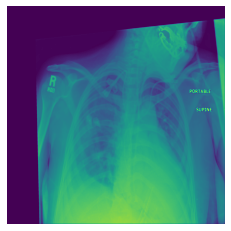

Index: 2422, decease: Pneumonia, path: /data/images_006/images/00012158_025.png, view: PA 
Image (1024, 1024)


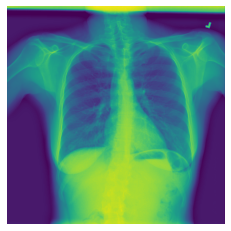

Index: 2522, decease: Pneumonia, path: /data/images_006/images/00012667_000.png, view: PA 
Image (1024, 1024)


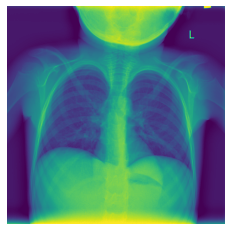

Index: 2534, decease: Pneumonia, path: /data/images_006/images/00012733_000.png, view: PA 
Image (1024, 1024)


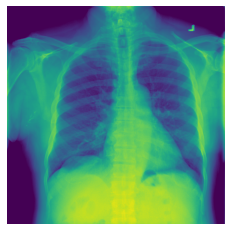

Index: 2875, decease: Pneumonia, path: /data/images_007/images/00014201_008.png, view: PA 
Image (1024, 1024)


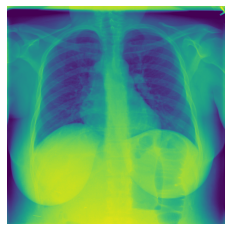

Index: 3593, decease: Pneumonia, path: /data/images_008/images/00017714_019.png, view: AP 
Image (1024, 1024)


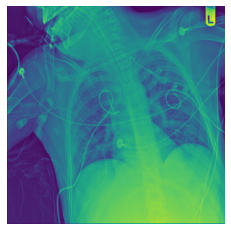

Index: 3858, decease: Pneumonia, path: /data/images_009/images/00019021_001.png, view: PA 
Image (1024, 1024)


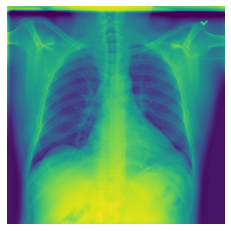

Index: 4033, decease: Pneumonia, path: /data/images_009/images/00019865_013.png, view: PA 
Image (1024, 1024)


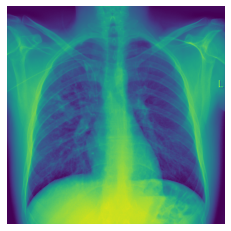

Index: 4282, decease: Pneumonia, path: /data/images_010/images/00021127_018.png, view: PA 
Image (1024, 1024)


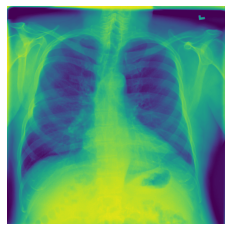

Index: 4459, decease: Pneumonia, path: /data/images_010/images/00022192_032.png, view: PA 
Image (1024, 1024)


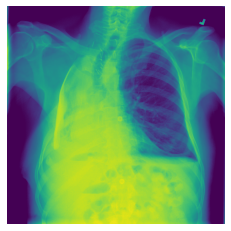

Index: 4583, decease: Pneumonia, path: /data/images_010/images/00022877_014.png, view: AP 
Image (1024, 1024)


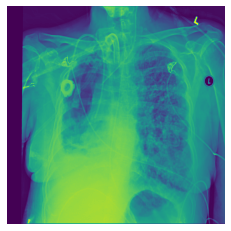

Index: 4966, decease: Pneumonia, path: /data/images_011/images/00026179_003.png, view: AP 
Image (1024, 1024)


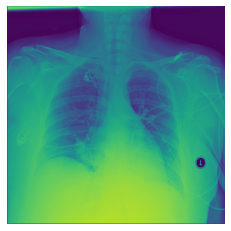

Index: 5366, decease: Pneumonia, path: /data/images_012/images/00028924_005.png, view: AP 
Image (1024, 1024)


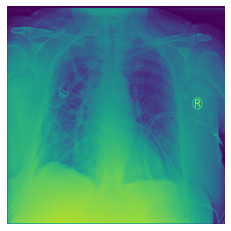

In [23]:
#all_xray_df.sample(3)
pure_pneumonia_df = sample_df[sample_df['Finding Labels']=='Pneumonia']
print(f'display pneumonia sample {len(pure_pneumonia_df)}')
for i in pure_pneumonia_df.index:
    path =pure_pneumonia_df.loc[i]['path']
    pos = pure_pneumonia_df.loc[i]['View Position']
    print(f'Index: {i}, decease: Pneumonia, path: {path}, view: {pos} ')
    
    fig ,ax = plt.subplots()
    img = mpimg.imread(path)
    print(f'Image {img.shape}')
    ax.imshow(img)
    
    plt.axis('off')
    plt.show()

In [24]:
1024/224

4.571428571428571

Display pneumonia with other deseace sample 48
Index: 256, decease: Cardiomegaly|Effusion|Pneumonia, path: /data/images_002/images/00001373_010.png, position: AP


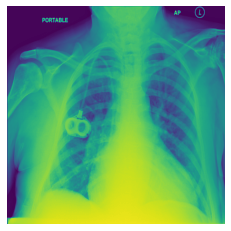

Index: 287, decease: Consolidation|Infiltration|Pneumonia, path: /data/images_002/images/00001529_004.png, position: PA


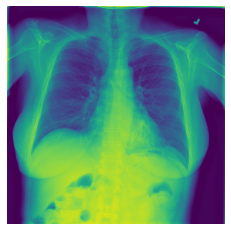

Index: 382, decease: Infiltration|Nodule|Pneumonia, path: /data/images_002/images/00001993_000.png, position: PA


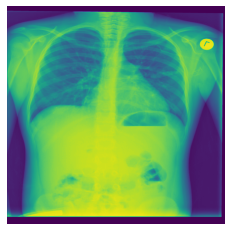

Index: 723, decease: Nodule|Pneumonia, path: /data/images_002/images/00003789_000.png, position: AP


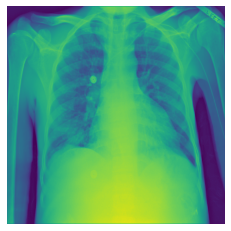

Index: 775, decease: Mass|Nodule|Pneumonia, path: /data/images_003/images/00004074_000.png, position: PA


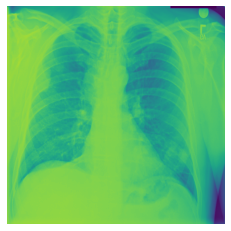

Index: 776, decease: Atelectasis|Pneumonia, path: /data/images_003/images/00004075_000.png, position: PA


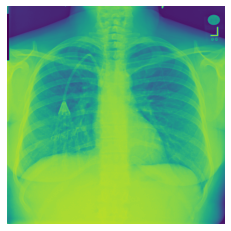

Index: 1078, decease: Emphysema|Pneumonia, path: /data/images_003/images/00005681_018.png, position: AP


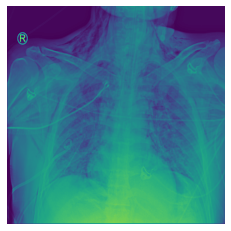

Index: 1305, decease: Atelectasis|Pneumonia, path: /data/images_004/images/00006843_000.png, position: PA


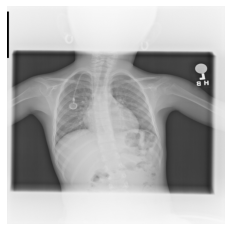

Index: 1344, decease: Consolidation|Pneumonia, path: /data/images_004/images/00007007_016.png, position: AP


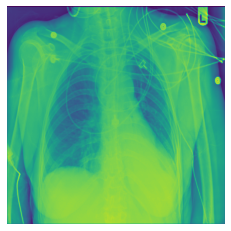

Index: 1573, decease: Atelectasis|Consolidation|Mass|Pneumonia, path: /data/images_004/images/00008154_000.png, position: PA


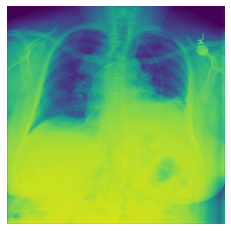

Index: 1683, decease: Nodule|Pneumonia, path: /data/images_004/images/00008763_001.png, position: PA


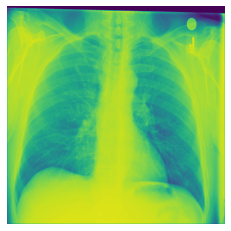

Index: 1871, decease: Atelectasis|Consolidation|Edema|Infiltration|Pneumonia, path: /data/images_005/images/00009863_007.png, position: AP


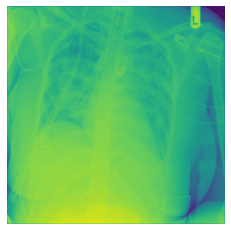

Index: 1889, decease: Atelectasis|Edema|Effusion|Infiltration|Pneumonia, path: /data/images_005/images/00009925_012.png, position: AP


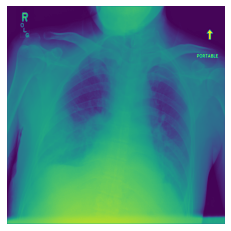

Index: 1898, decease: Edema|Infiltration|Mass|Pneumonia|Pneumothorax, path: /data/images_005/images/00009953_025.png, position: AP


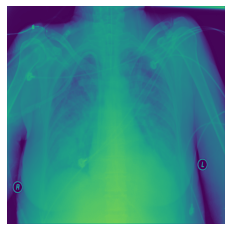

Index: 2035, decease: Infiltration|Pneumonia, path: /data/images_005/images/00010552_005.png, position: PA


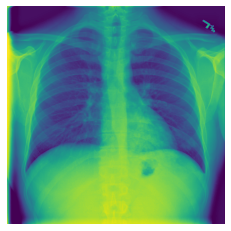

Index: 2148, decease: Infiltration|Nodule|Pneumonia, path: /data/images_005/images/00011104_004.png, position: PA


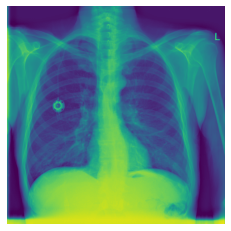

Index: 2183, decease: Infiltration|Pneumonia, path: /data/images_005/images/00011251_010.png, position: AP


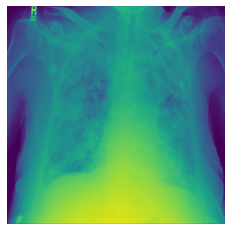

Index: 2552, decease: Consolidation|Edema|Effusion|Pneumonia, path: /data/images_006/images/00012834_113.png, position: AP


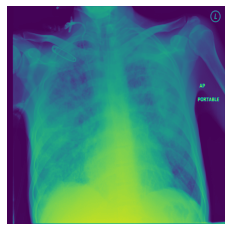

Index: 2635, decease: Cardiomegaly|Edema|Infiltration|Pneumonia, path: /data/images_006/images/00013249_033.png, position: AP


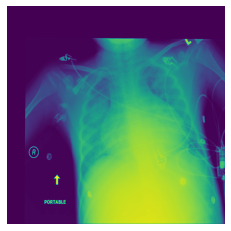

Index: 2791, decease: Atelectasis|Pneumonia, path: /data/images_007/images/00013952_000.png, position: PA


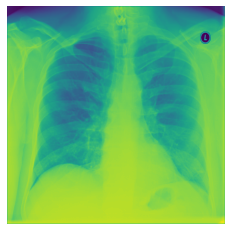

Index: 2802, decease: Atelectasis|Consolidation|Effusion|Infiltration|Pneumonia, path: /data/images_007/images/00013993_100.png, position: AP


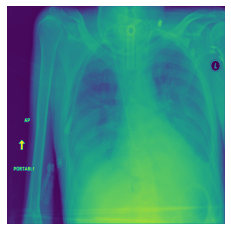

Index: 2808, decease: Edema|Pneumonia, path: /data/images_007/images/00014004_012.png, position: AP


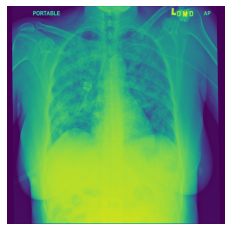

Index: 2818, decease: Edema|Pneumonia, path: /data/images_007/images/00014022_085.png, position: AP


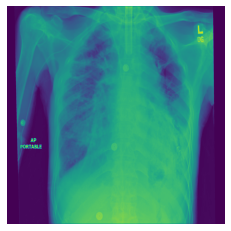

Index: 2860, decease: Edema|Infiltration|Pneumonia, path: /data/images_007/images/00014149_029.png, position: AP


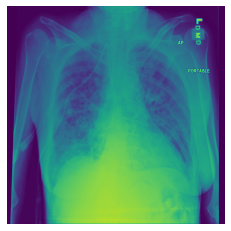

Index: 3057, decease: Infiltration|Pneumonia, path: /data/images_007/images/00015069_000.png, position: PA


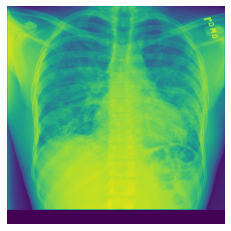

Index: 3342, decease: Consolidation|Pneumonia, path: /data/images_008/images/00016508_012.png, position: AP


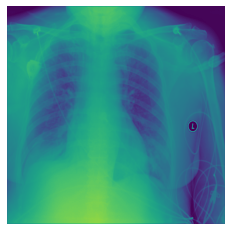

Index: 3403, decease: Infiltration|Pneumonia, path: /data/images_008/images/00016786_001.png, position: AP


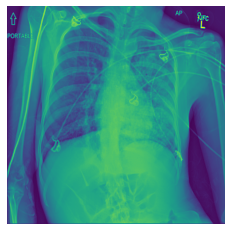

Index: 3404, decease: Infiltration|Pneumonia, path: /data/images_008/images/00016786_005.png, position: AP


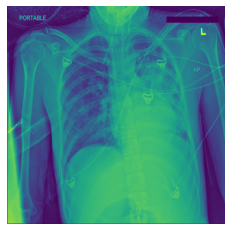

Index: 3540, decease: Edema|Infiltration|Pneumonia, path: /data/images_008/images/00017504_058.png, position: AP


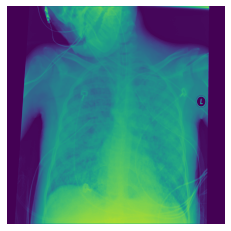

Index: 3541, decease: Edema|Emphysema|Infiltration|Pneumonia, path: /data/images_008/images/00017504_062.png, position: AP


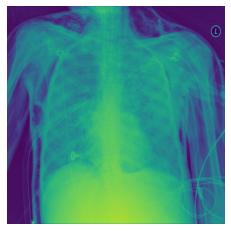

Index: 3894, decease: Infiltration|Pneumonia, path: /data/images_009/images/00019176_089.png, position: AP


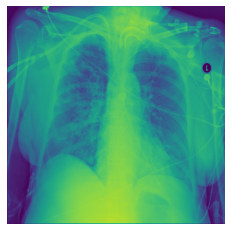

Index: 3996, decease: Edema|Infiltration|Pneumonia, path: /data/images_009/images/00019750_022.png, position: AP


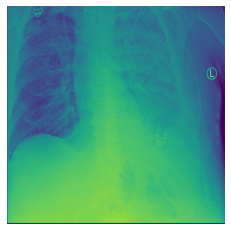

Index: 4046, decease: Edema|Pneumonia, path: /data/images_009/images/00019938_003.png, position: AP


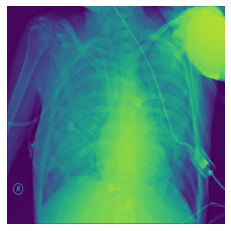

Index: 4153, decease: Atelectasis|Consolidation|Infiltration|Pneumonia, path: /data/images_009/images/00020408_014.png, position: AP


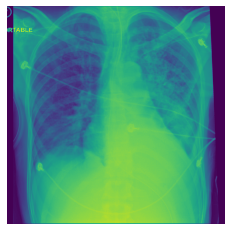

Index: 4176, decease: Infiltration|Pneumonia, path: /data/images_009/images/00020482_025.png, position: AP


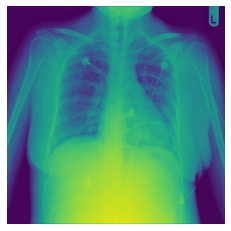

Index: 4178, decease: Edema|Infiltration|Pneumonia, path: /data/images_009/images/00020482_061.png, position: AP


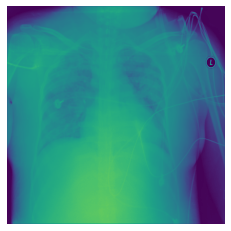

Index: 4301, decease: Atelectasis|Edema|Effusion|Pneumonia, path: /data/images_010/images/00021201_053.png, position: AP


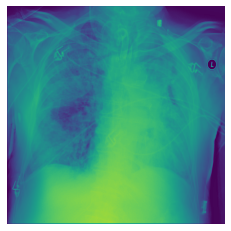

Index: 4322, decease: Consolidation|Mass|Nodule|Pneumonia, path: /data/images_010/images/00021289_000.png, position: AP


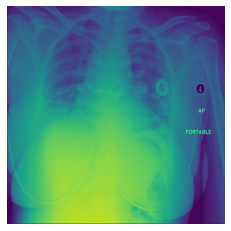

Index: 4411, decease: Consolidation|Pneumonia, path: /data/images_010/images/00021818_026.png, position: PA


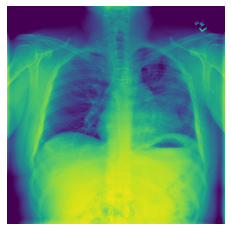

Index: 4477, decease: Pleural_Thickening|Pneumonia, path: /data/images_010/images/00022310_006.png, position: AP


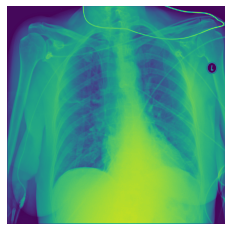

Index: 4581, decease: Atelectasis|Pneumonia, path: /data/images_010/images/00022870_004.png, position: AP


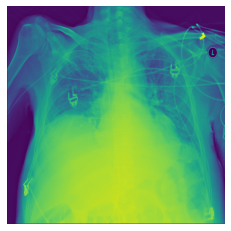

Index: 4618, decease: Infiltration|Pneumonia, path: /data/images_010/images/00023089_004.png, position: PA


In [ ]:
pneumonia_other_df = sample_df[sample_df['Finding Labels']!='Pneumonia']
pneumonia_other_df = pneumonia_other_df[pneumonia_other_df.Pneumonia==1]
print(f'Display pneumonia with other deseace sample {len(pneumonia_other_df)}')
for i in pneumonia_other_df.index:
    decease = pneumonia_other_df.loc[i]['Finding Labels']
    pos = pneumonia_other_df.loc[i]['View Position']
    path =pneumonia_other_df.loc[i]['path']
    print(f'Index: {i}, decease: {decease}, path: {path}, position: {pos}')
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Display no deceases sample 10
Index: 5348, decease: No Finding, path: /data/images_012/images/00028846_007.png, position: PA


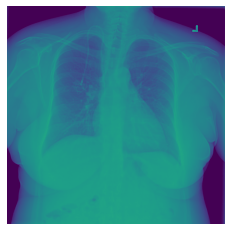

Index: 2092, decease: No Finding, path: /data/images_005/images/00010798_000.png, position: PA


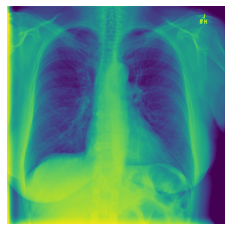

Index: 76, decease: No Finding, path: /data/images_001/images/00000444_001.png, position: AP


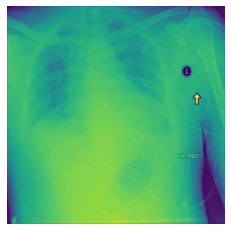

Index: 4876, decease: No Finding, path: /data/images_011/images/00025642_000.png, position: PA


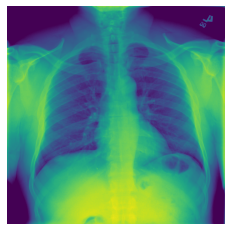

Index: 1427, decease: No Finding, path: /data/images_004/images/00007407_001.png, position: PA


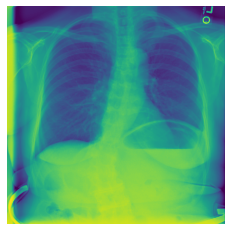

Index: 2640, decease: No Finding, path: /data/images_006/images/00013260_009.png, position: AP


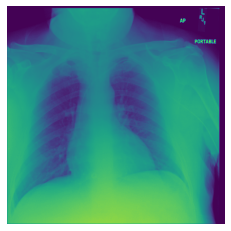

Index: 4730, decease: No Finding, path: /data/images_010/images/00024360_000.png, position: PA


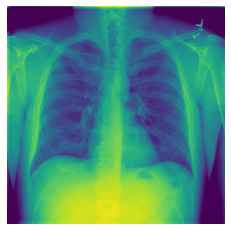

Index: 2642, decease: No Finding, path: /data/images_006/images/00013262_003.png, position: AP


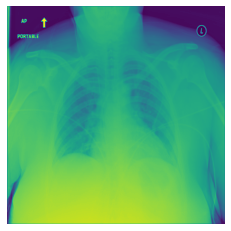

Index: 4542, decease: No Finding, path: /data/images_010/images/00022708_006.png, position: PA


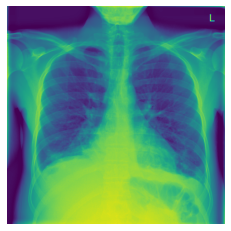

Index: 4114, decease: No Finding, path: /data/images_009/images/00020261_002.png, position: PA


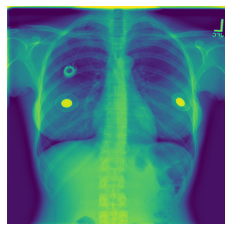

In [25]:
no_decease_df = sample_df[sample_df['No Finding']==1].sample(10)
print(f'Display no deceases sample {len(no_decease_df)}')
for i in no_decease_df.index:
    deceases = no_decease_df.loc[i]['Finding Labels']
    path =no_decease_df.loc[i]['path']
    pos = no_decease_df.loc[i]['View Position']
    print(f'Index: {i}, decease: {deceases}, path: {path}, position: {pos}')
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# 3 The number of cases including

## 3.1 Number of pneumonia cases

In [26]:
print(f'Number of pneumonia case: {len(all_xray_df[all_xray_df.Pneumonia==1])}')

Number of pneumonia case: 1430


## 3.2 Number of non-pneumonia cases

In [27]:
print(f'Number of non-pneumonia case: {len(all_xray_df[all_xray_df.Pneumonia==0])}')

Number of non-pneumonia case: 110674


### 4 The distribution of other diseases that are comorbid with pneumonia

In [28]:
#Function compute the number of cases and ration dor each column_name
#input:
#    ex: 
#        df = pd.DataFrame({
#            'A': [1,0,0,0],
#            'B': [1,0,1,0],
#            'C': [0,1,0,0]    
#         }) 
#         column_names =['A','B','C']
#        cases, ratios = extract_cases_and_ratios(df,column_names)
#        cases = [1,2,1]
#        ratios = [1/3,2/3,1/3]
# notes: the total of ratios could be greate than 1            
def extract_cases_and_ratios(df, column_names):
    ratios = []
    cases  = []
    size  = len(df)
    for column_name in column_names:
       result =  df[column_name].value_counts()
       if(len(result)>1):
        count=0
       count = result[1]
       ratio = count/size*100
       ratios.append(ratio)
       cases.append(count)
    return cases,ratios  

In [29]:
 cases, ratios = extract_cases_and_ratios(all_xray_df,finding_labels)

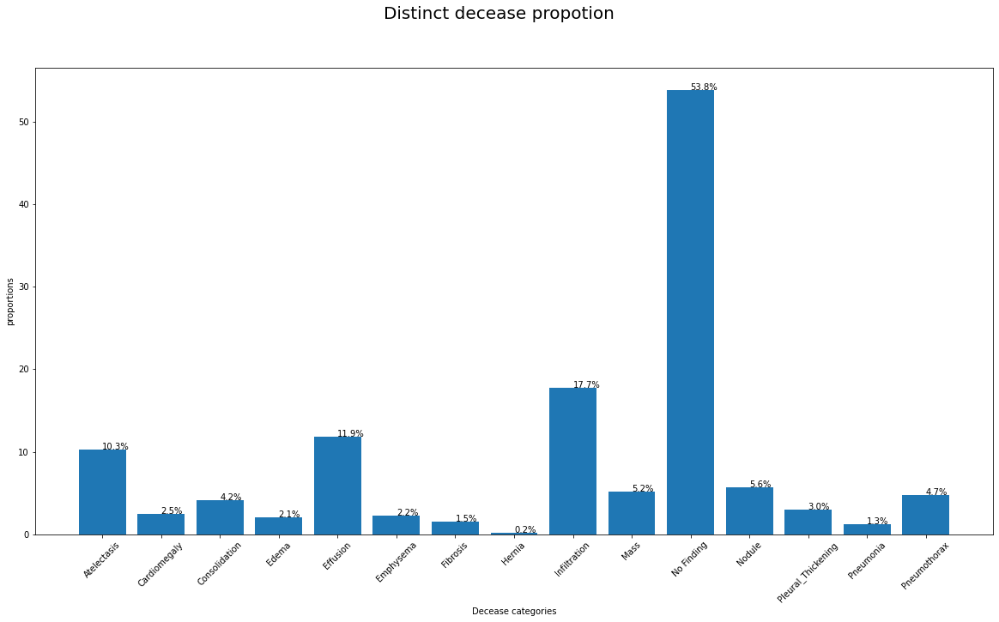

In [30]:
#display distinct ratio for eache decease or no decease (!!! total ration could >100 because co- deceases)
fig, ax = plt.subplots(figsize= (20,10))
fig.suptitle('Distinct decease propotion', fontsize=20)
ax.bar(finding_labels,ratios)
for i,v in enumerate(ratios):
    plt.text(finding_labels[i],v,f"{v:.1f}%")
plt.xlabel('Decease categories')
plt.ylabel('proportions')
plt.xticks(rotation=45)
plt.show()


### We see over all dianostics the following: 
- around 53.8% of case have a healthy lung diagnostic. 
- aroung the 57% other diagnositics as not healthy with the following major decease:
  1. Infiltation   17.1 %.
  2. Effusion      11.9 %.
  3. Actelectasis  10.3 %.
-Pneumonia is rare with only around 1.3% of cases.

### Asses ratio of other deceases with Pnemonia 

In [31]:
#create a dataframe with only 'Pneumonia'  
pneumonia_xray_df = all_xray_df[all_xray_df.Pneumonia==1] 

In [32]:
other_decease_labels = finding_labels.copy()
other_decease_labels.remove('Pneumonia')
other_decease_labels.remove('No Finding')

In [33]:
cases, ratios = extract_cases_and_ratios(pneumonia_xray_df,other_decease_labels)    

### Evaluate Pneumonia without any other deceases dignosed

In [34]:
pneumonia_xray_df['other_decease'] = (pneumonia_xray_df[other_decease_labels]==1).any(axis=1).astype(int)
pure_pneumonia_number = len(pneumonia_xray_df[pneumonia_xray_df.other_decease==0])
ratio = pure_pneumonia_number/len(pneumonia_xray_df)*100
cases.append(pure_pneumonia_number)
ratios.append(ratio)
###add the column to display tu pure pneumonia ratio
other_decease_labels.append('Only_pneumonia')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [35]:
print(f'Pure pneumonia case : {pure_pneumonia_number}')

Pure pneumonia case : 322


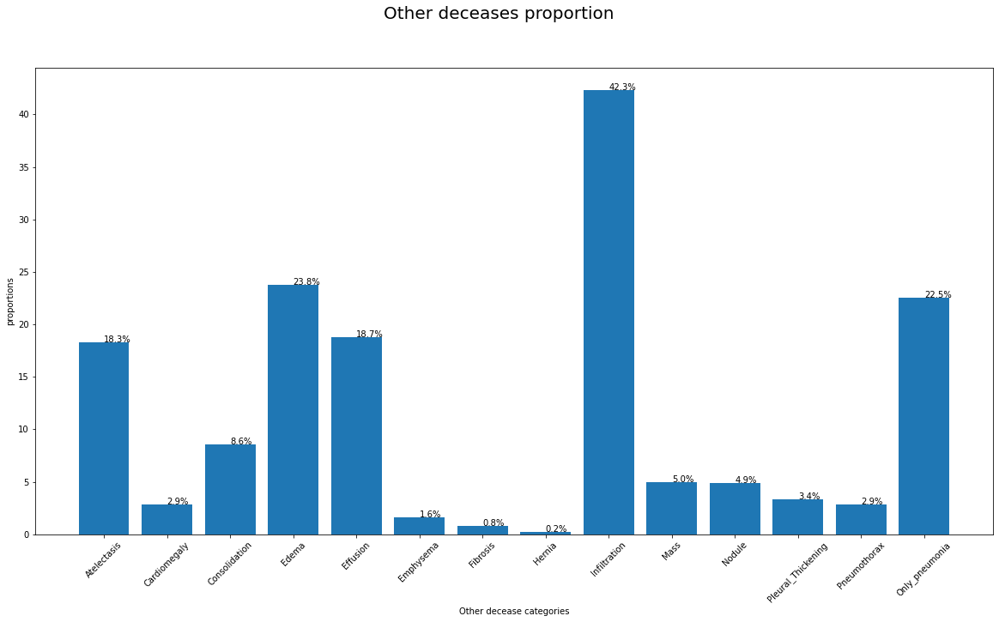

In [36]:
#display distinct ratio for eache decease or no decease (!!! total ration could >100 because co- deceases)
fig, ax = plt.subplots(figsize= (20,10))
fig.suptitle('Other deceases proportion', fontsize=20)
ax.bar(other_decease_labels,ratios)
for i,v in enumerate(ratios):
    plt.text(other_decease_labels[i],v,f"{v:.1f}%")
plt.xlabel('Other decease categories')
plt.ylabel('proportions')
plt.xticks(rotation=45)
plt.show()

### We see that important co-decease (>5 %) are in the descendant order :
  1. Infiltration  42.3 %
  2. Edema         23.8 %
  3. Effusion      18.8 %
  4. Actelectasis  18.3 %
  5. Consolidation  8.6 %
  
  Note: there is 22.5 % of pure pneumonia cases
  
  

### co decease correlation

In [37]:
pneumonia_4_correlation = all_xray_df[np.array(finding_labels)]

In [38]:
corr = pneumonia_4_correlation.corr()

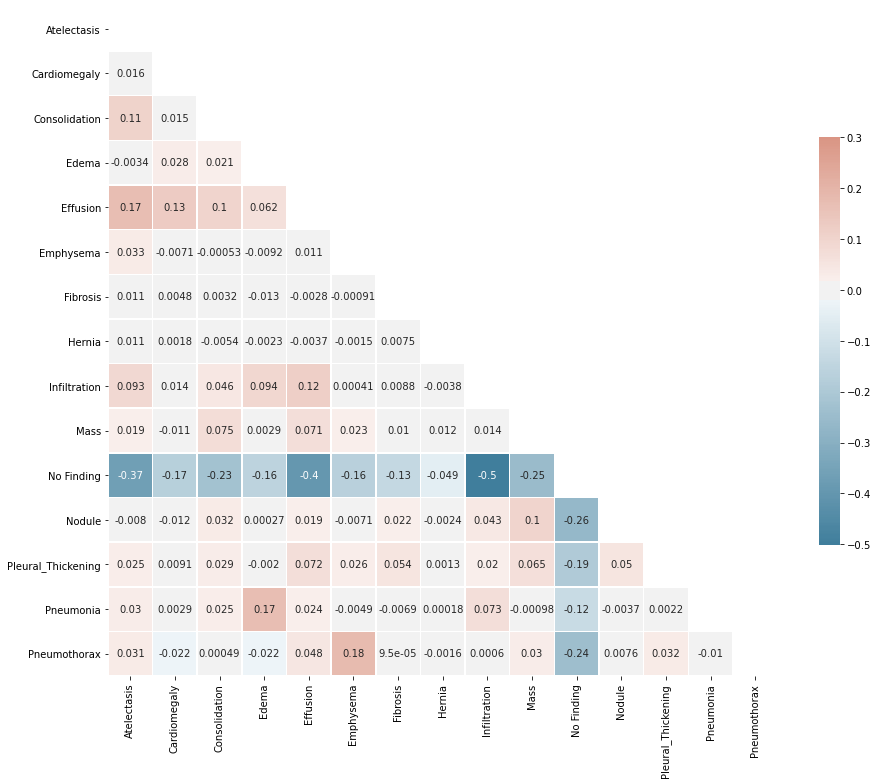

In [39]:

f, ax = plt.subplots(figsize=(15,15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,cmap=cmap,vmax=.3,center=0,square=True,linewidths=.5,annot=True,cbar_kws={"shrink": .5})
#sns.heatmap(corr,mask=mask,cmap=cmap,vmax=.5,center=0,square=True,linewidth=.5,cbar_kws={"shrink": .5})
#distribution age
#distribution gender

### We can see some light correlation for the following deceases:
- Edema 0.17
- Infiltration 0.07

Those deceases are also part of the co deceases identified before


# 5. Number of disease per patient

## 5.1 Check unicity of patient id

In [40]:
unique_ids = all_xray_df['Patient ID'].unique()
if len(all_xray_df) == len(unique_ids):
    print('One patient per line')
else:
    print(f'{len(all_xray_df)} == {len(unique_ids)}')

112104 == 30802


In [41]:
decease_columns = finding_labels.copy()
decease_columns.remove('No Finding')

In [42]:
decease_columns

['Atelectasis',
 'Cardiomegaly',
 'Consolidation',
 'Edema',
 'Effusion',
 'Emphysema',
 'Fibrosis',
 'Hernia',
 'Infiltration',
 'Mass',
 'Nodule',
 'Pleural_Thickening',
 'Pneumonia',
 'Pneumothorax']

In [43]:
# Define a custom aggregation function that returns 1 if there is at least one non-null value, otherwise 0.
def exist_decease(values):
    count = values.sum()
    return 1 if count > 0 else 0

In [44]:
all_per_patient= all_xray_df.groupby('Patient ID')[decease_columns].agg(exist_decease).reset_index()

In [45]:
all_per_patient['decease_nbr']=all_per_patient[decease_columns].sum(axis=1)

In [46]:
decease_patient= pd.DataFrame(all_per_patient[all_per_patient.decease_nbr>0]['decease_nbr'])

In [47]:
len(decease_patient)

14401

In [48]:
decease_patient

,decease_nbr
0,3
2,2
3,2
4,2
7,2
...,...
30782,6
30785,1
30789,2
30791,1


In [49]:
decease_count = Counter(decease_patient['decease_nbr'])
decease_count

Counter({3: 1637,
         2: 2908,
         1: 6742,
         10: 84,
         4: 1087,
         8: 205,
         5: 709,
         6: 516,
         7: 335,
         11: 28,
         9: 139,
         12: 7,
         13: 4})

Text(0, 0.5, 'number of poeples')

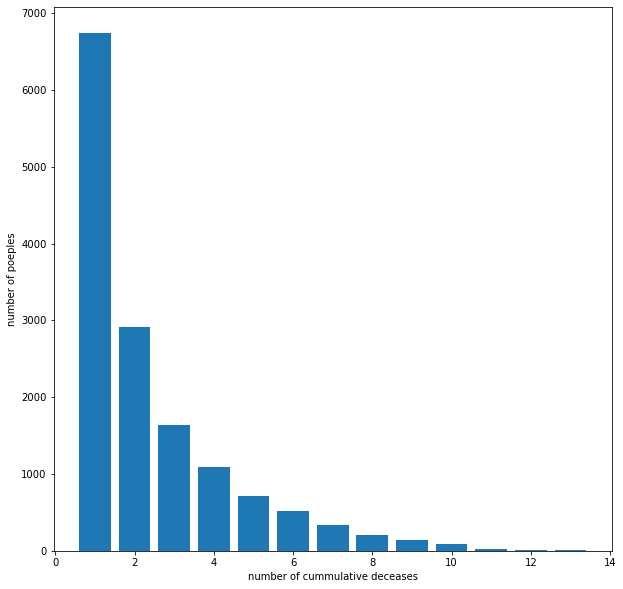

In [50]:
fig , ax =plt.subplots(figsize=(10,10))

ax.bar(list(decease_count.keys()),list(decease_count.values()))
ax.set_xlabel('number of cummulative deceases')
ax.set_ylabel('number of poeples')

In [51]:
max(all_per_patient['decease_nbr'])

13

In [52]:
all_per_patient[all_per_patient.decease_nbr==13]

,Patient ID,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax,decease_nbr
12020,12021,1,1,1,1,1,1,1,0,1,1,1,1,1,1,13
14021,14022,1,1,1,1,1,1,1,0,1,1,1,1,1,1,13
16777,16778,1,1,1,1,1,1,1,0,1,1,1,1,1,1,13
26449,26451,1,1,1,1,1,1,1,0,1,1,1,1,1,1,13


# 6. Pixel-level assessments of the imaging data for healthy & disease states of interest (e.g. histograms of intensity values) and compare distributions across diseases.

## 6.0 Initialisation

In [53]:
threshold = 140

In [54]:
def plot_and_get_intensities(df,threshold):
    intensities = []
    intensities_means = []
    mask
    for i in df.index:
        fig ,ax = plt.subplots(1,3,figsize=(15,15))
        path =df.loc[i]['path']
        img = mpimg.imread(path)
        #denormalize
        img = img*255
        #print(img.shape)
        img_mask = (img > threshold)
        img_bin = img_mask
        #print(img_bin.shape)
        img_intensities = img[img_mask].tolist()
        intensities.extend(img_intensities)
        intensities_means.append(np.mean(img_intensities))
        ax[0].hist(img.ravel(),bins=5)
        ax[1].imshow(img)
        ax[2].imshow(img_bin)
    return(intensities, intensities_means)    

## 6.1 Histogram of intensity level for patient with only pneumonia 

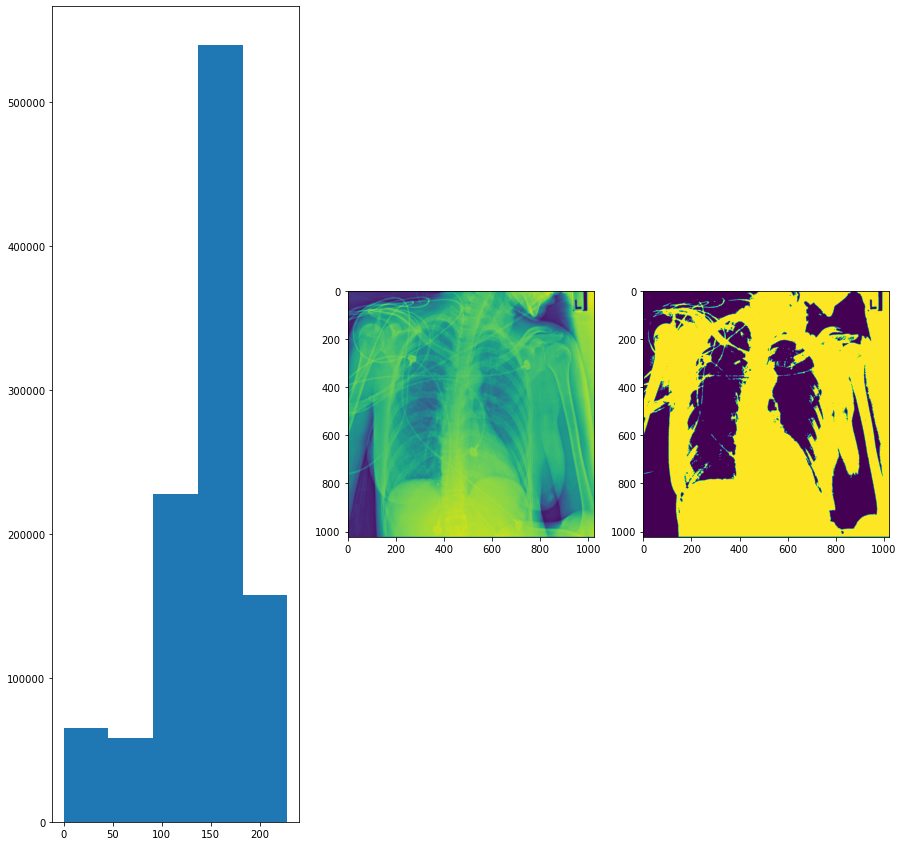

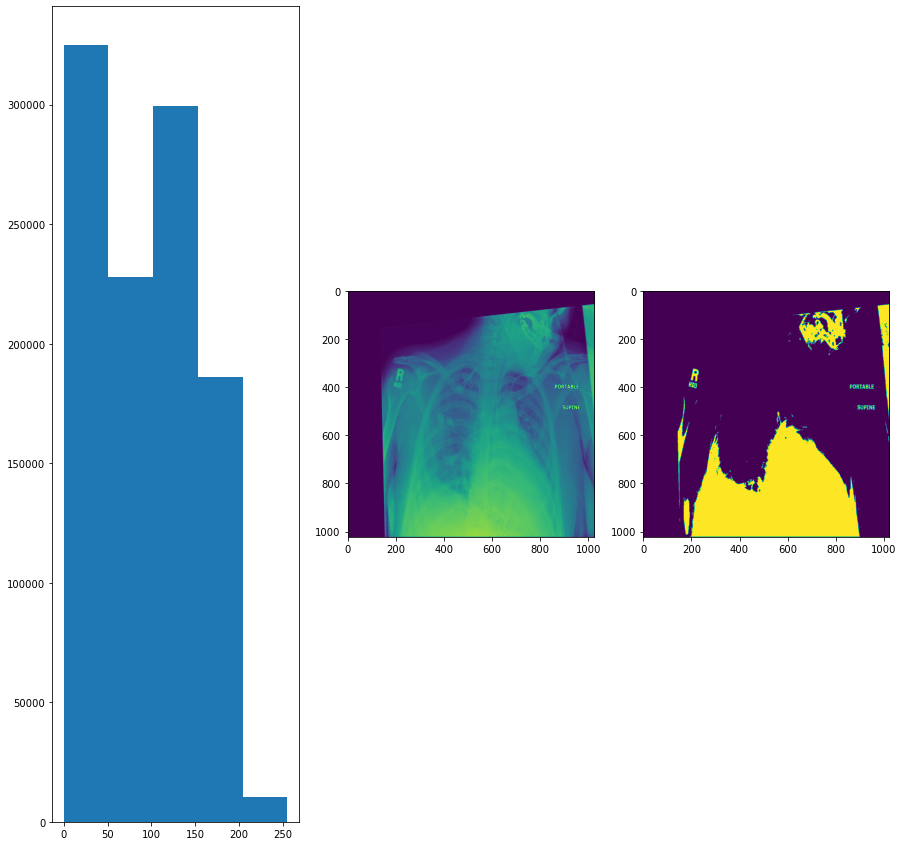

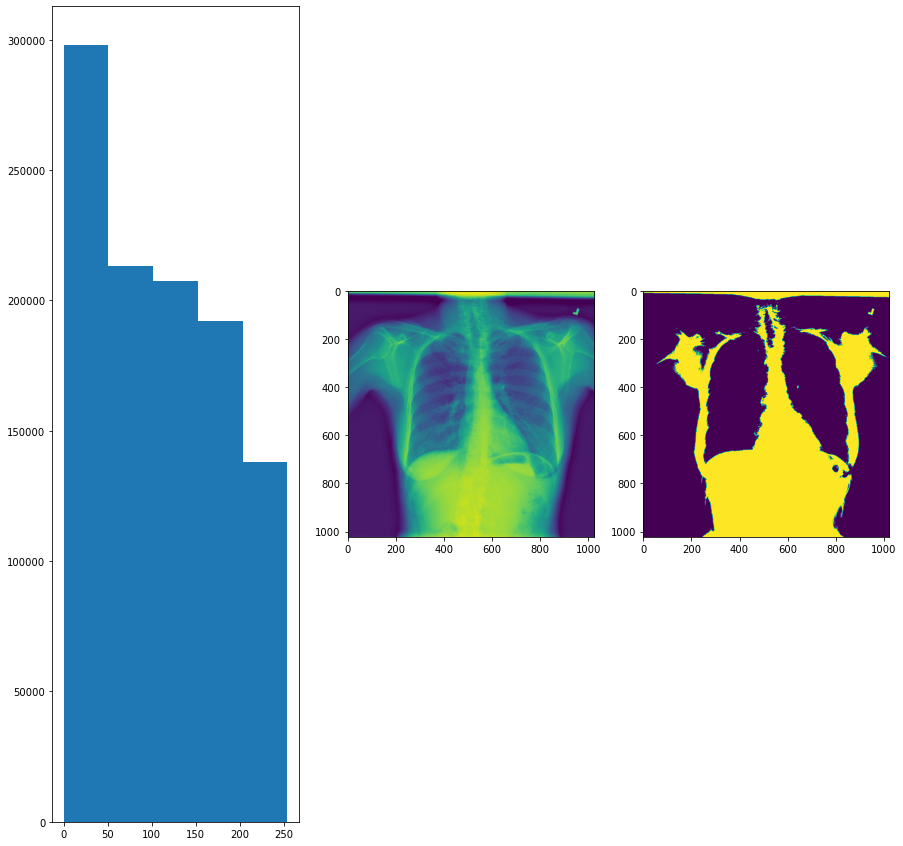

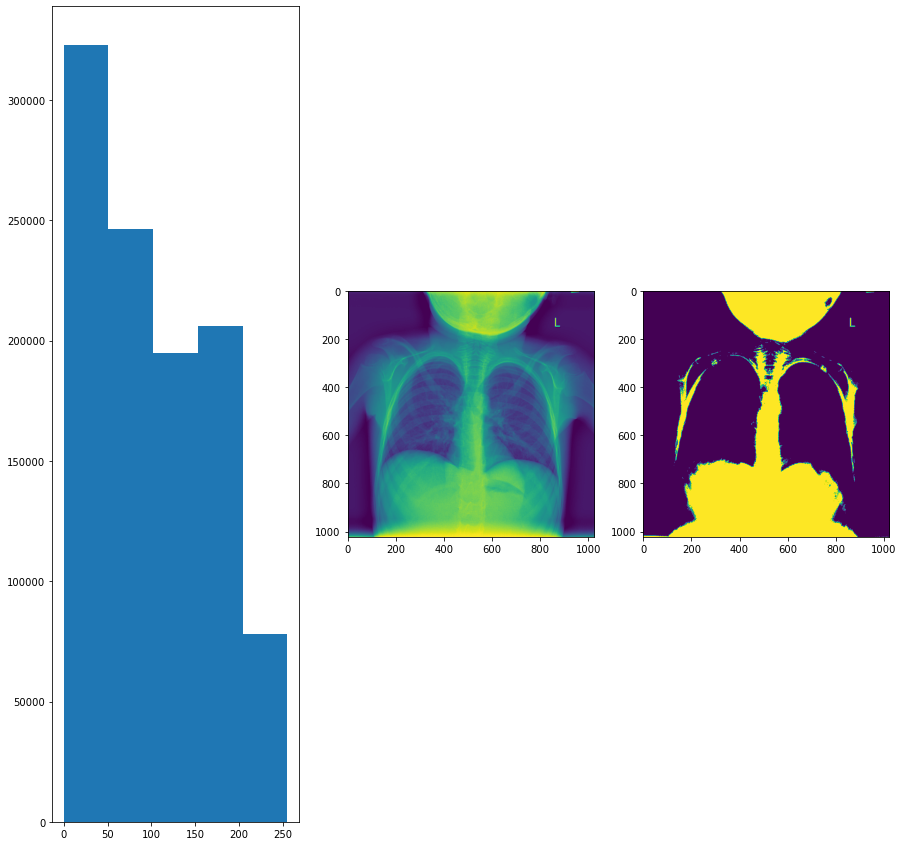

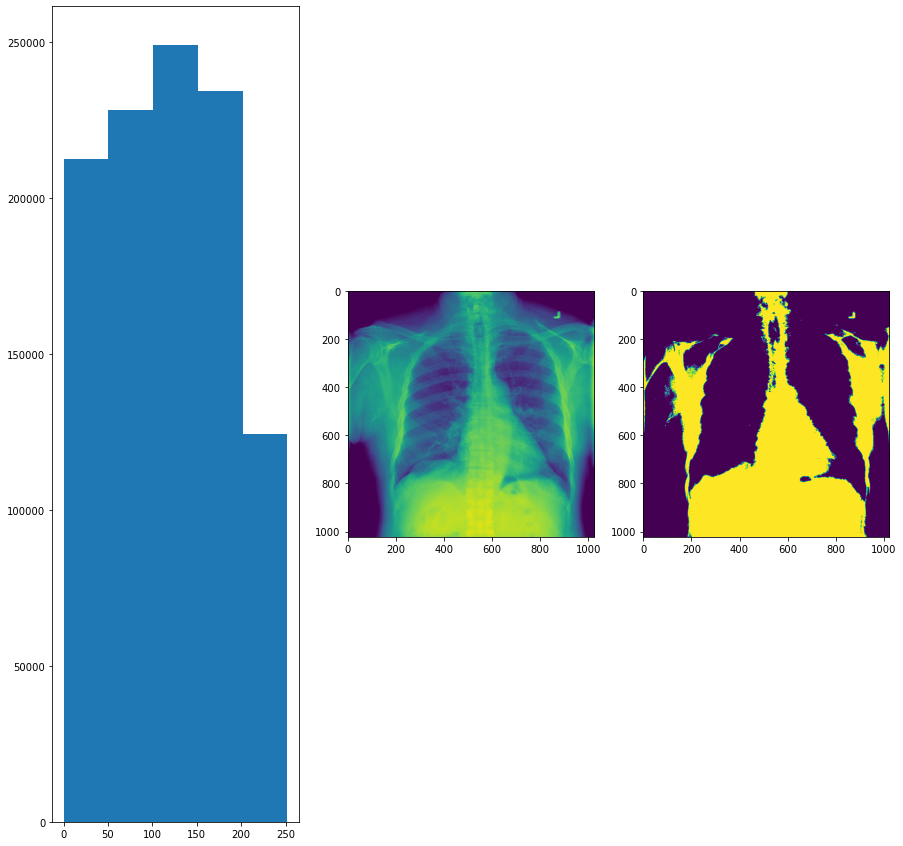

...

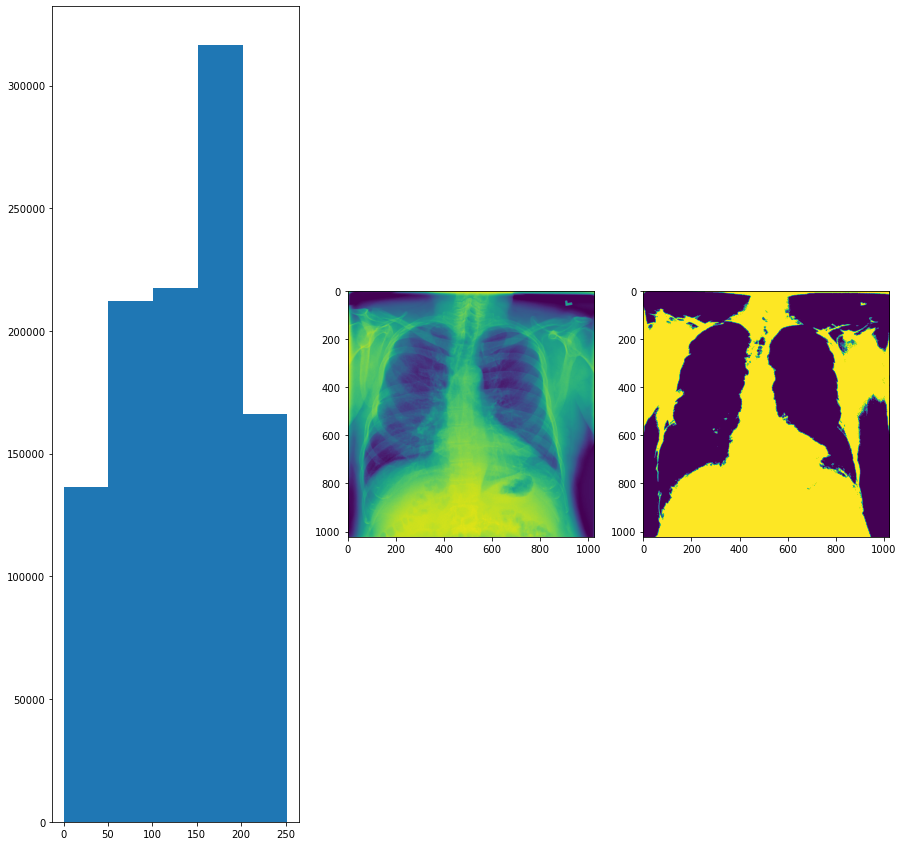

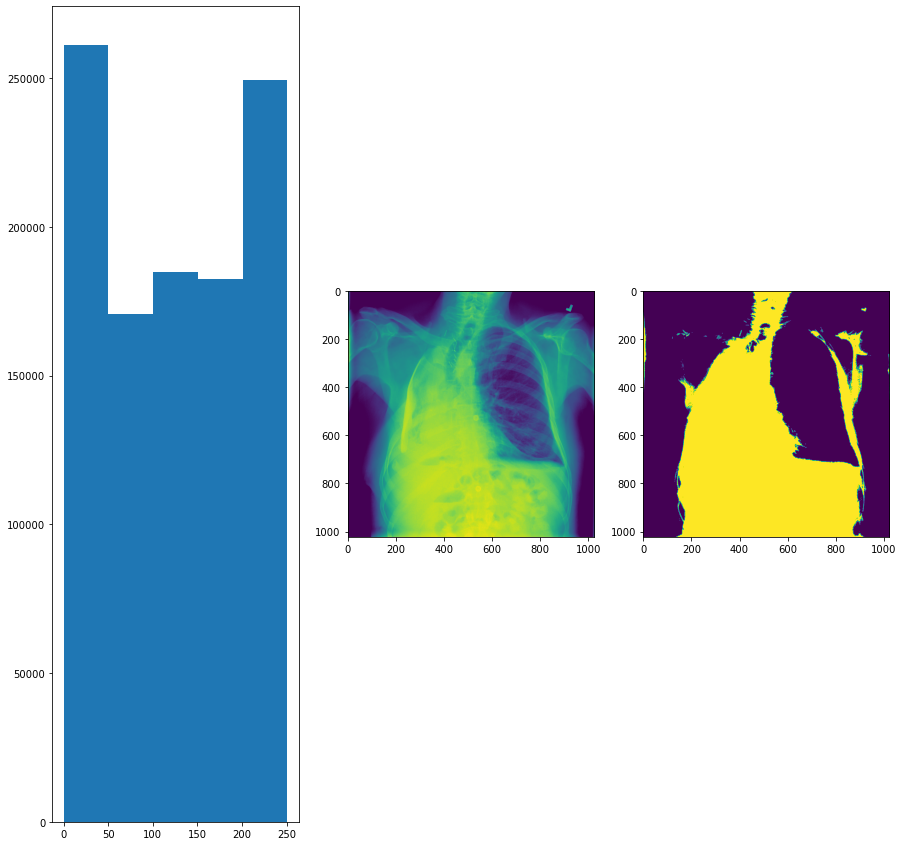

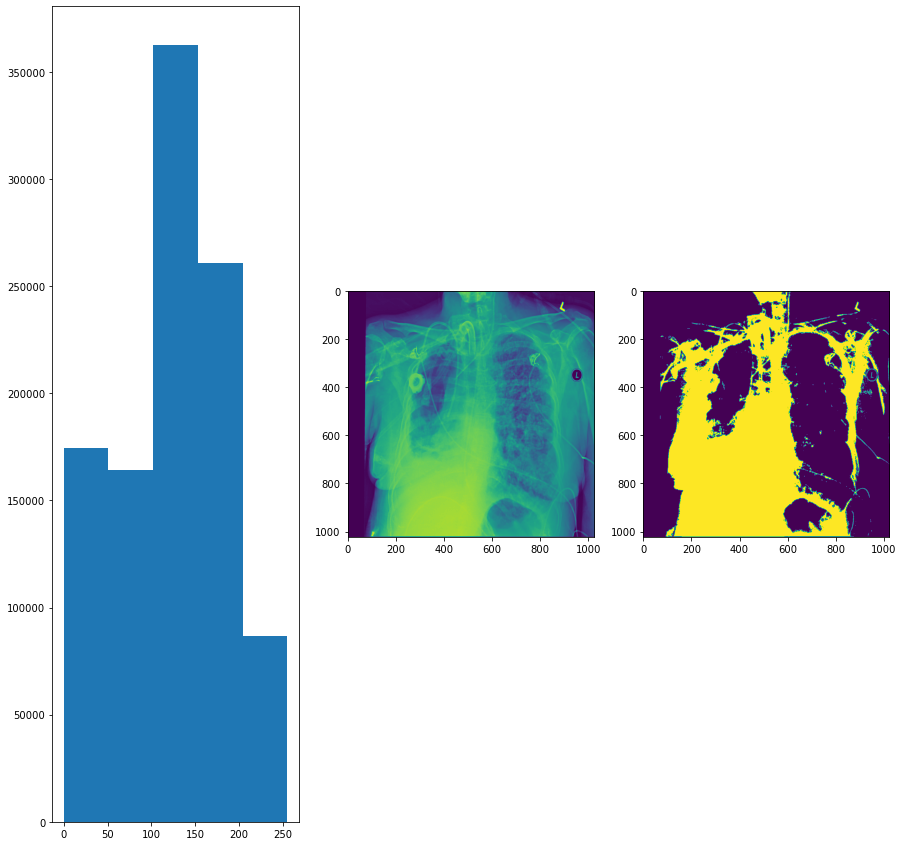

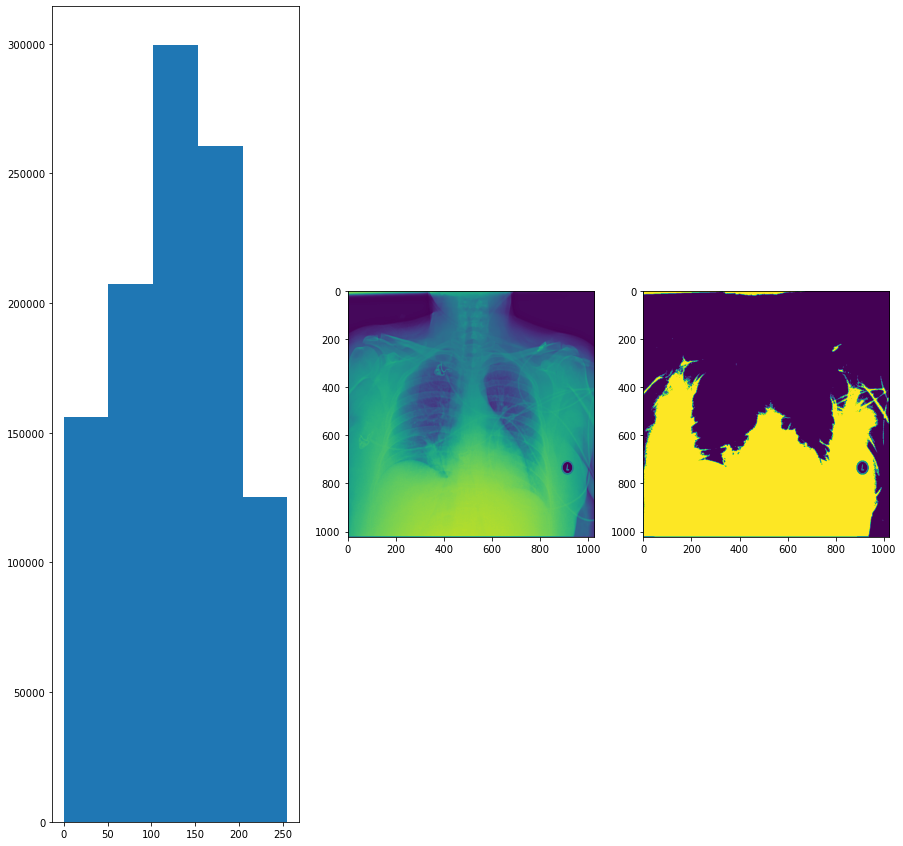

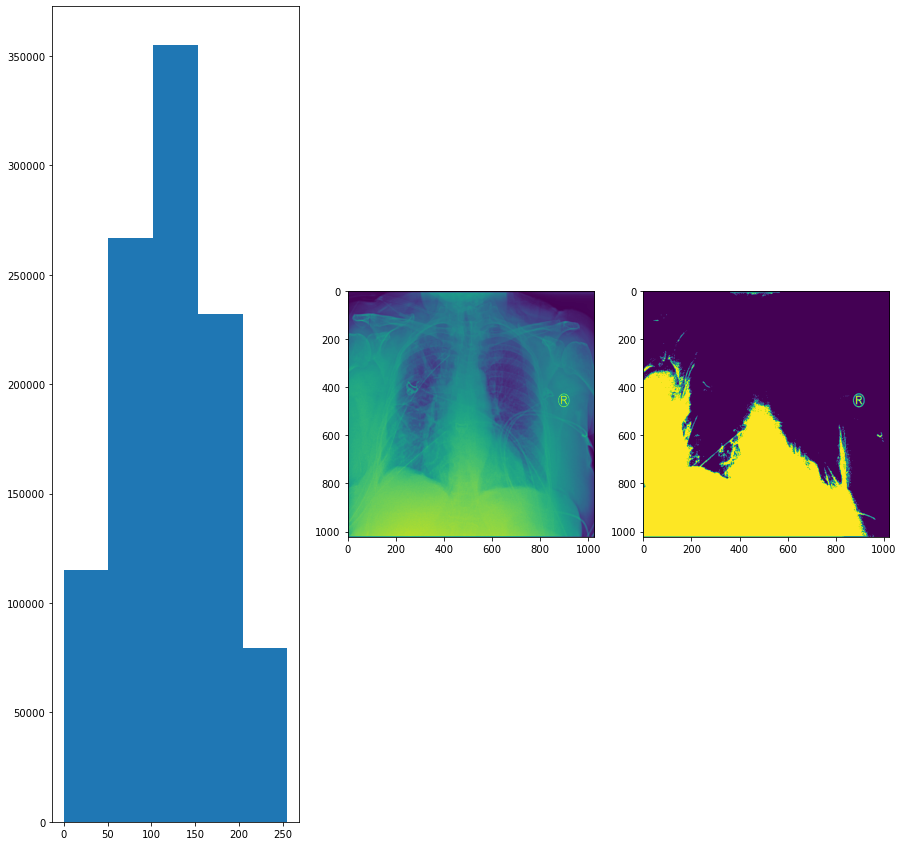

In [55]:
pure_pneumonia_intensities,pure_pneumonia_intensities_means = plot_and_get_intensities(pure_pneumonia_df,threshold)

## 6.2 Histogram of intensity level for patient with pneumonia and other decease.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


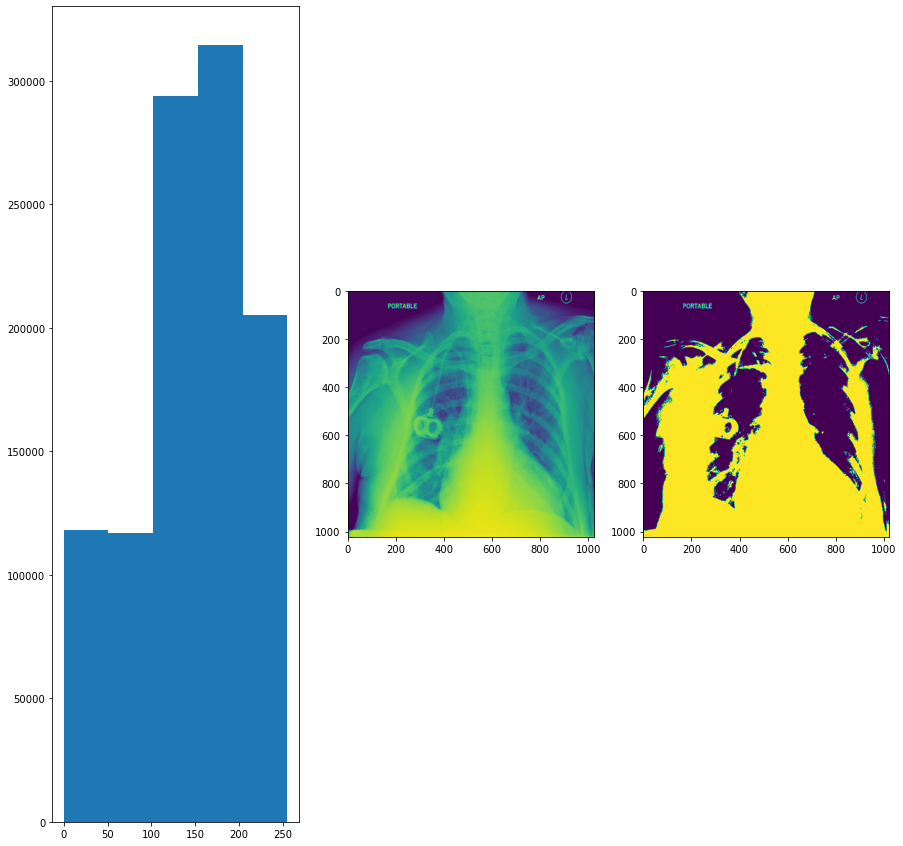

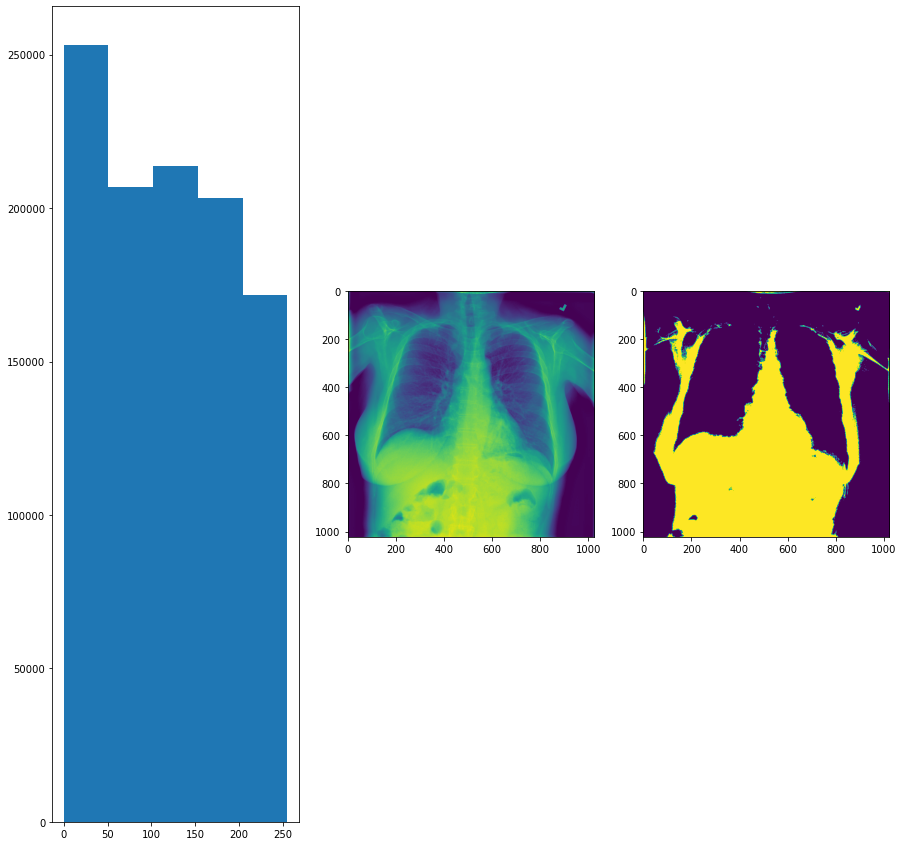

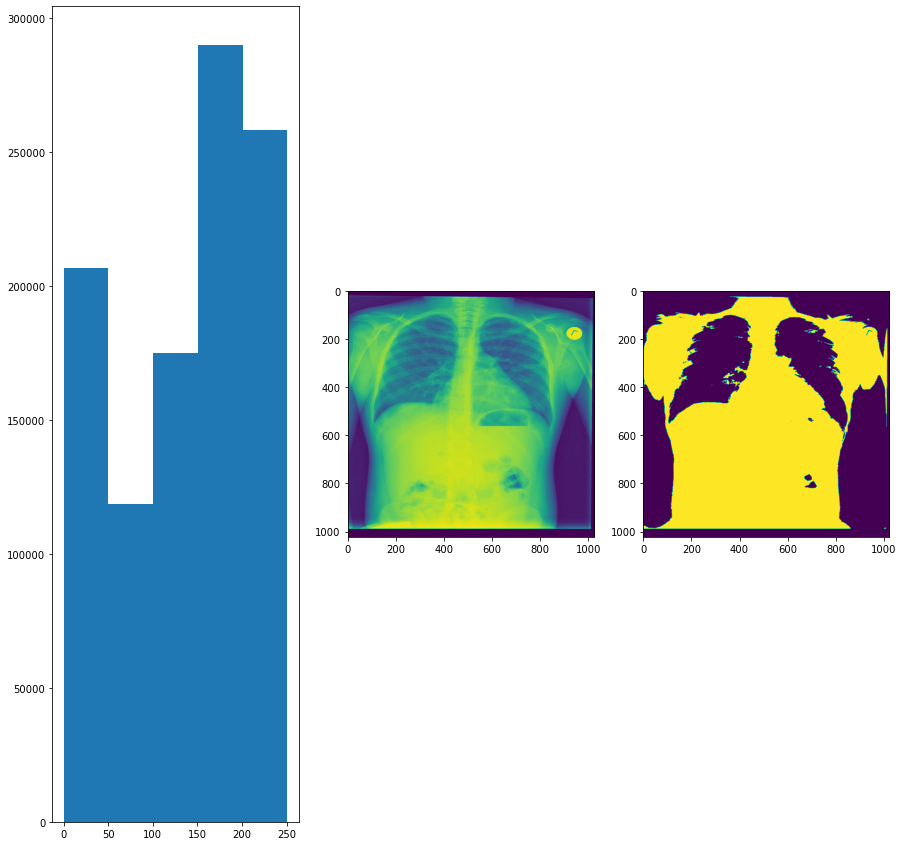

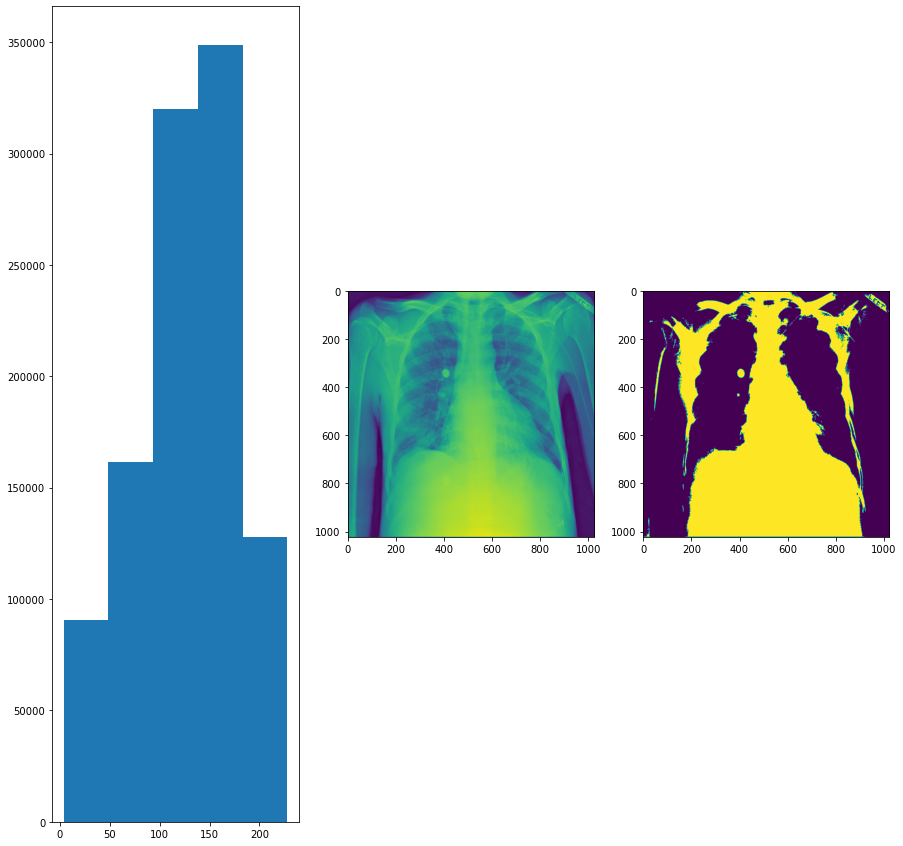

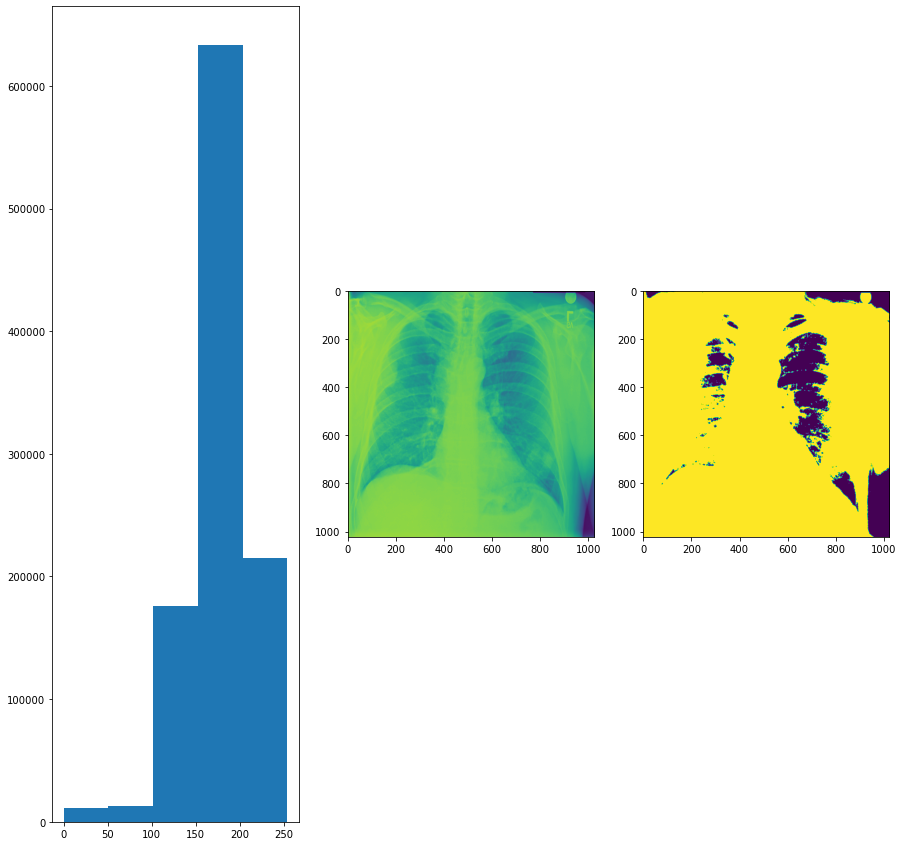

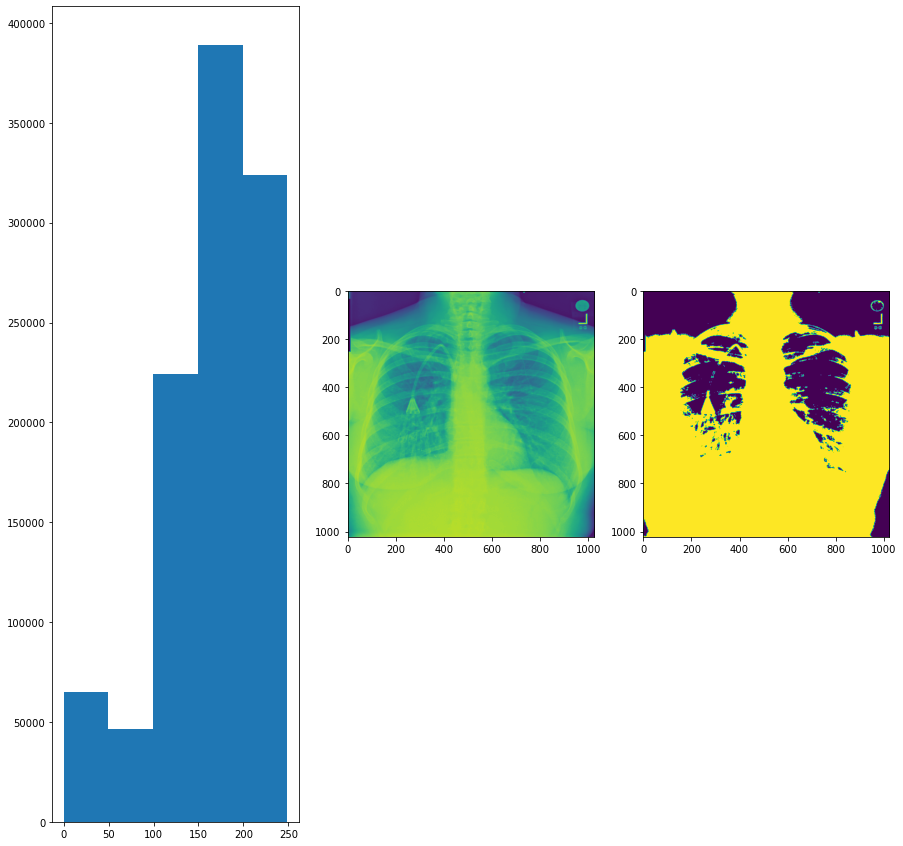

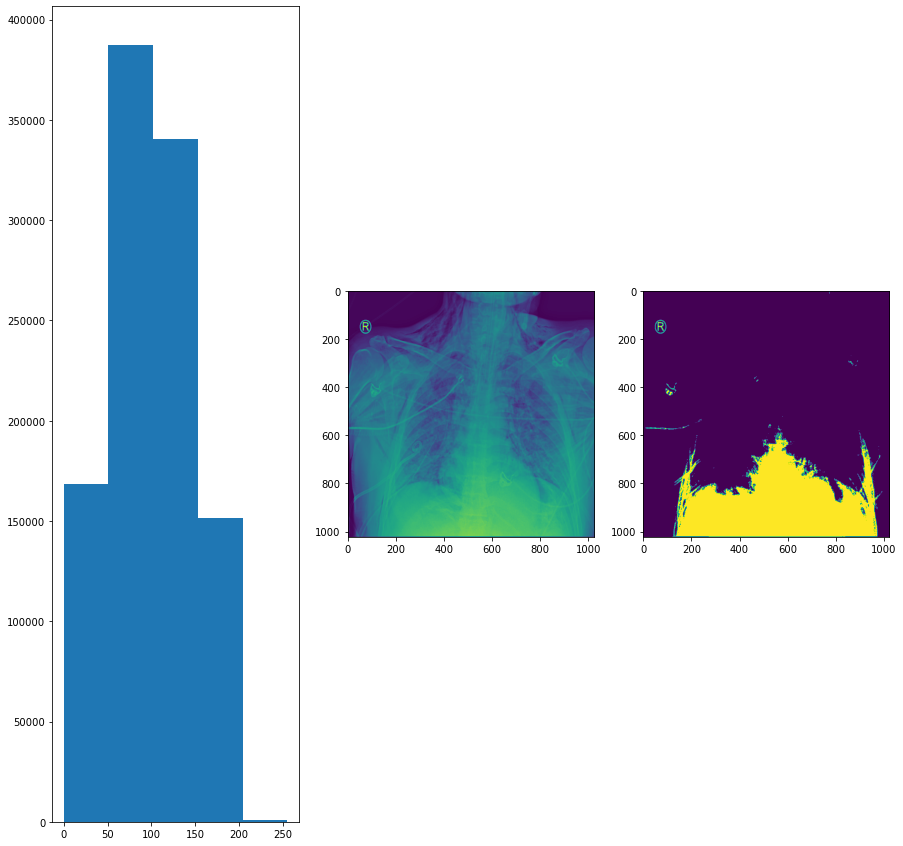

ValueError: Unsupported dtype

<Figure size 1080x1080 with 3 Axes>

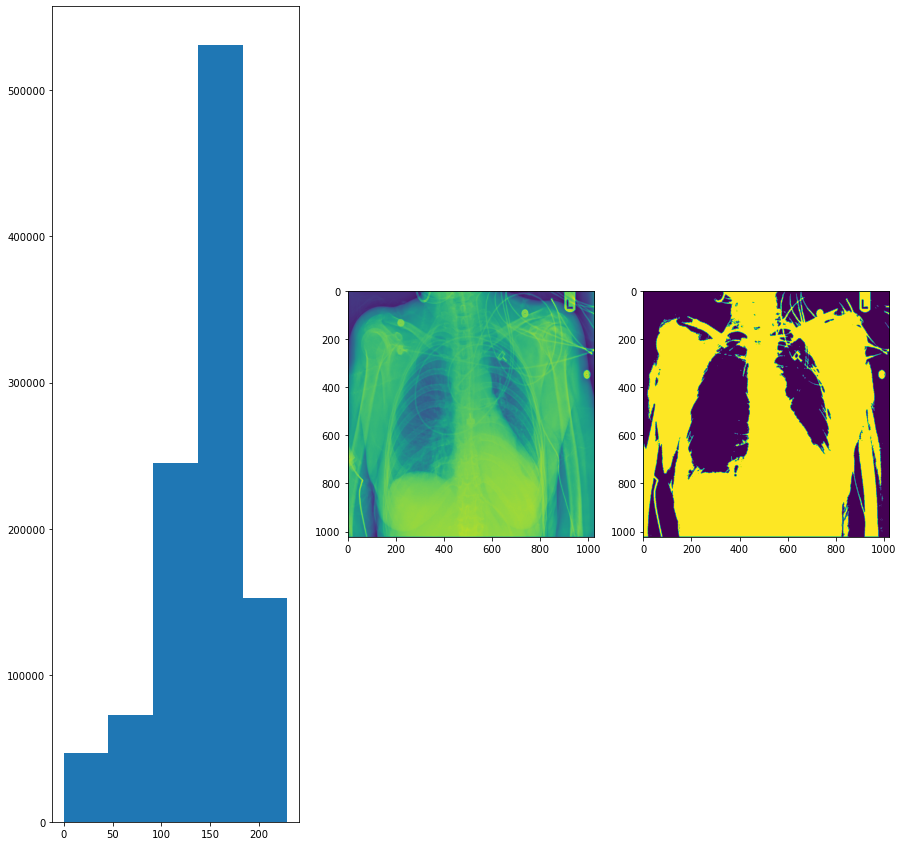

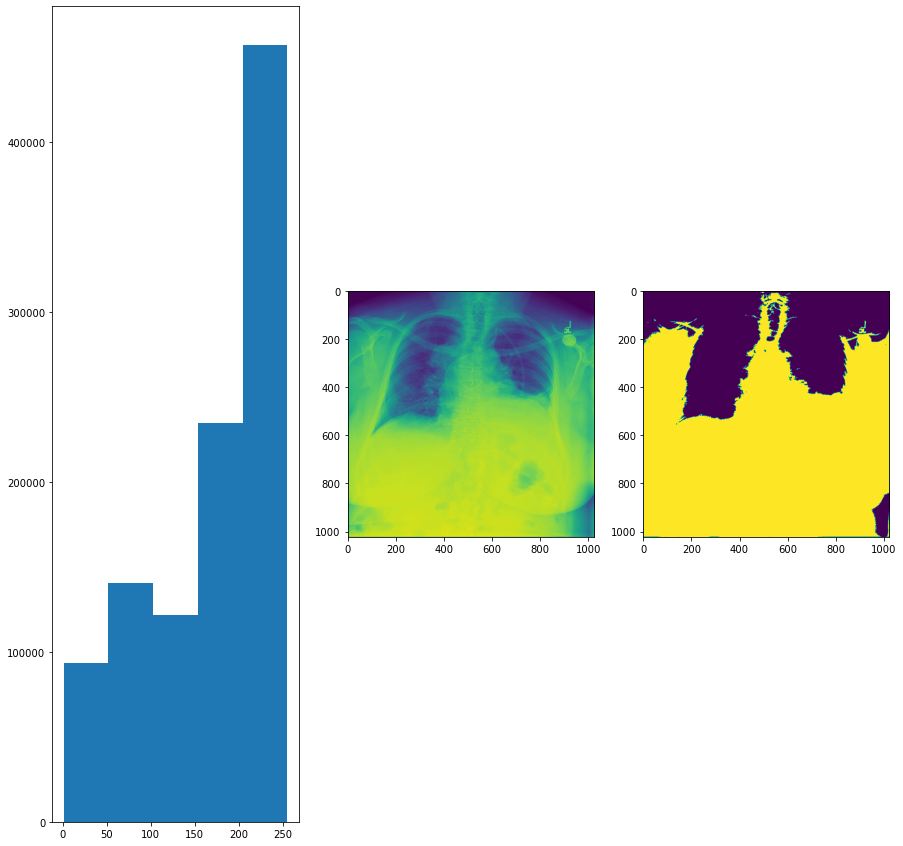

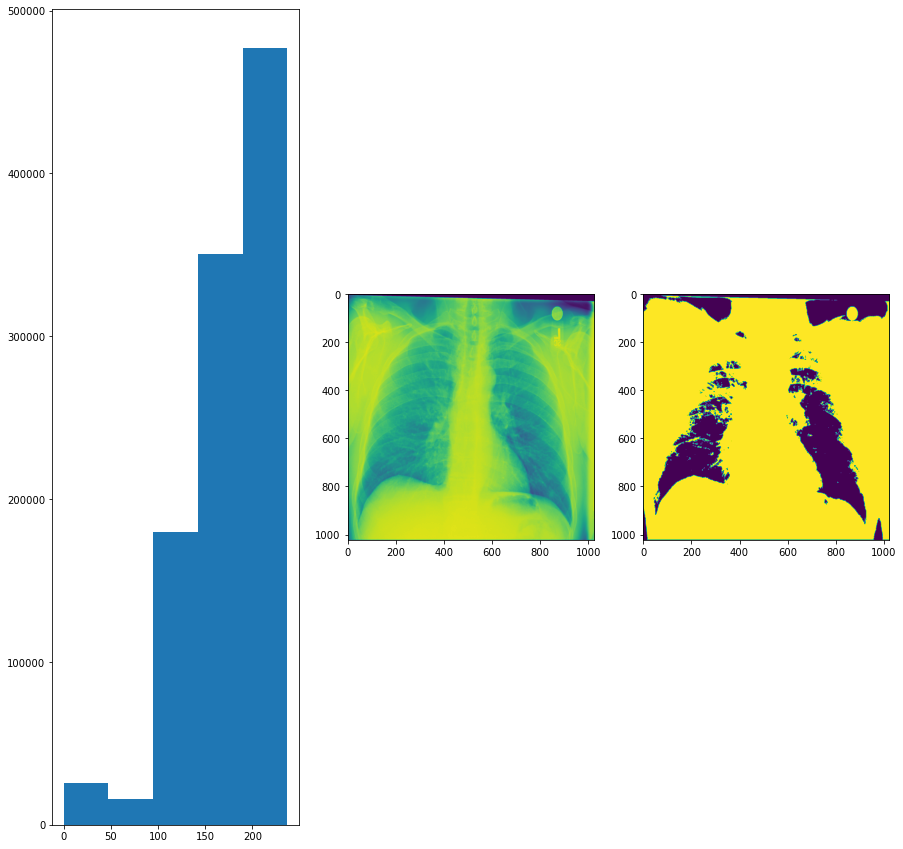

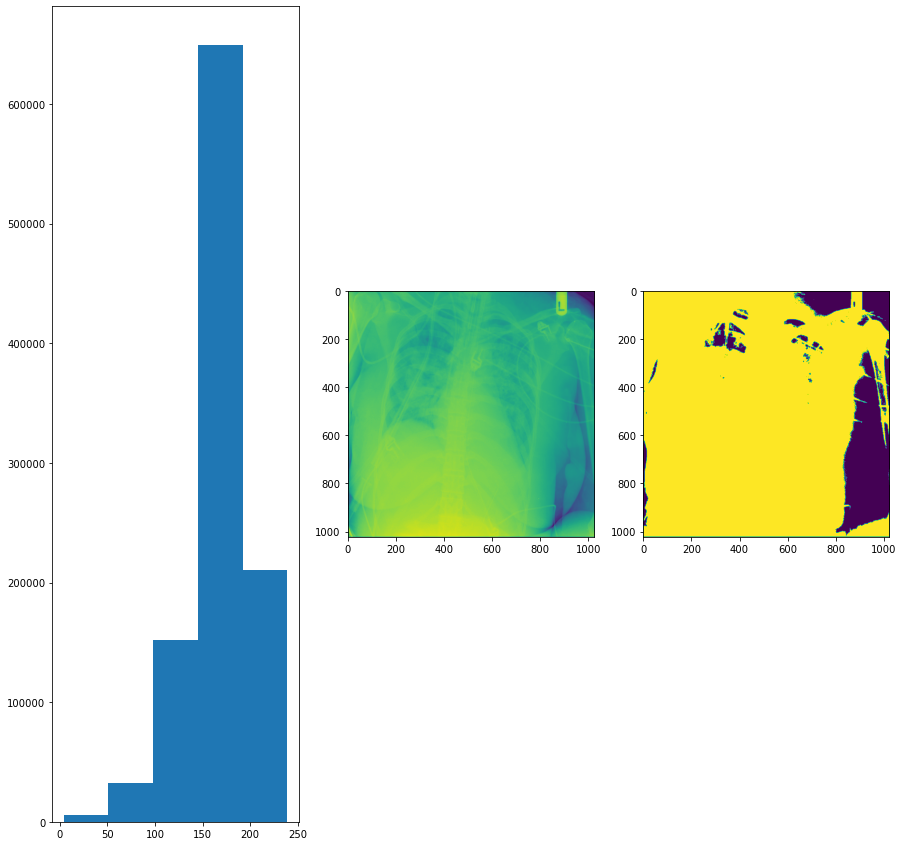

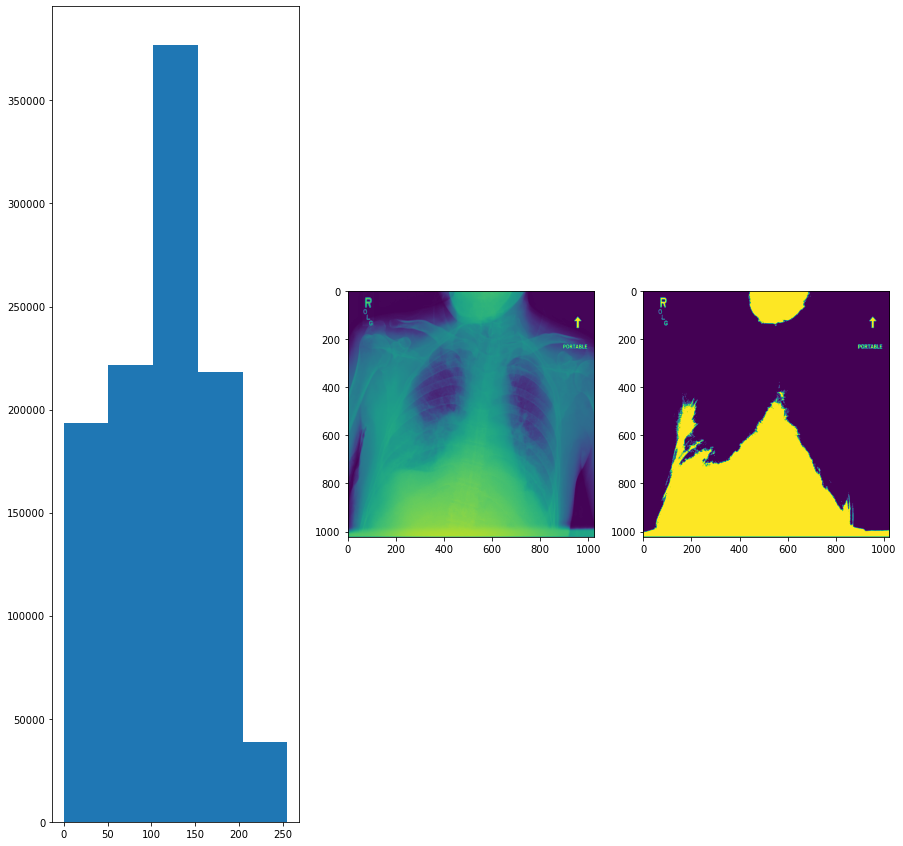

...

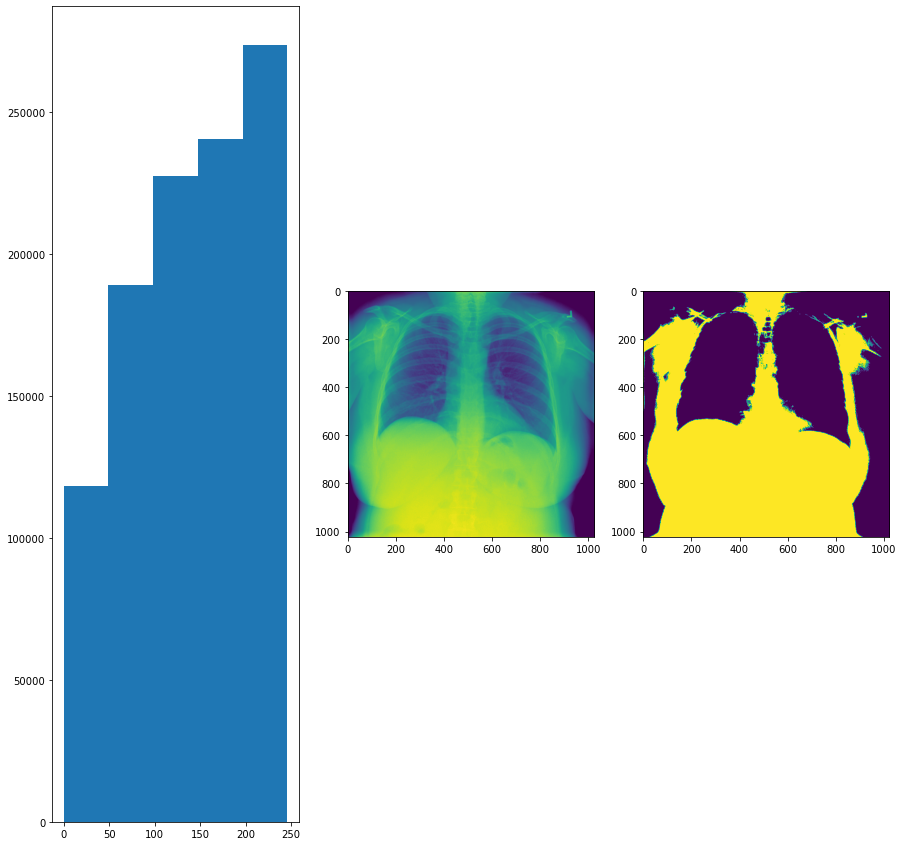

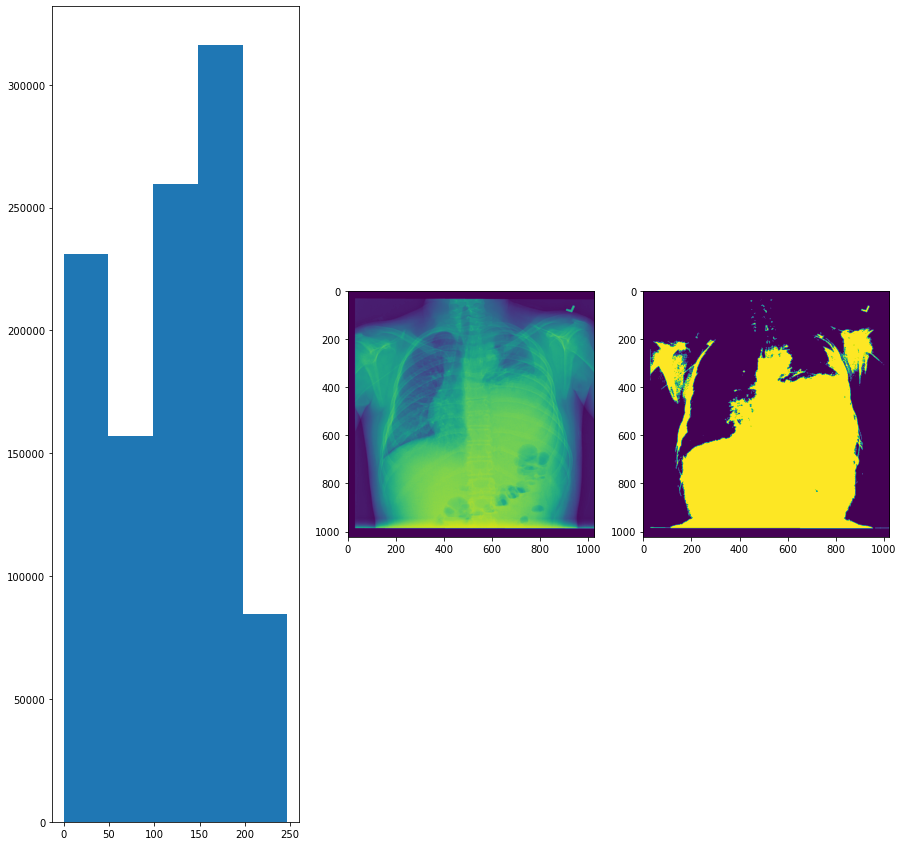

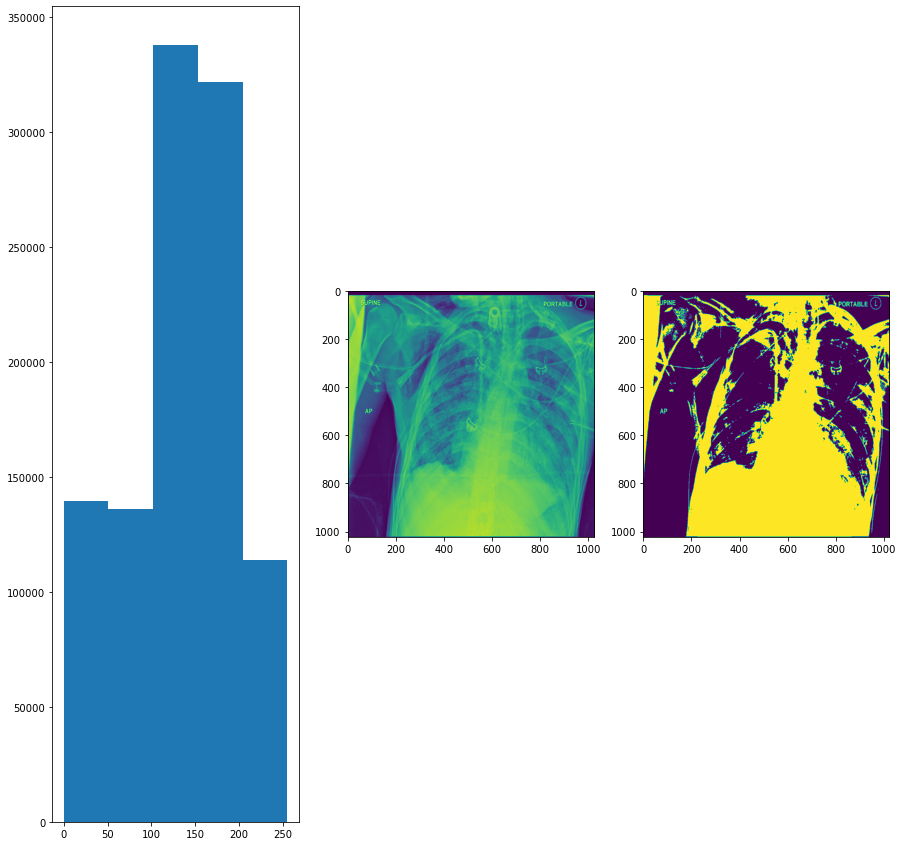

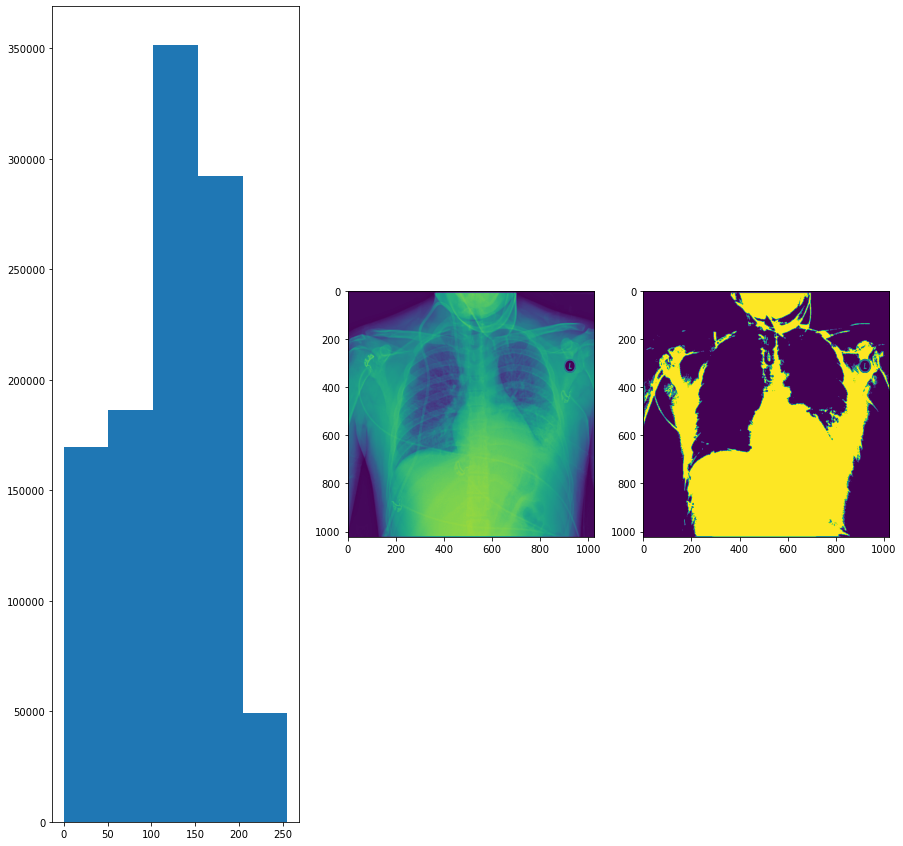

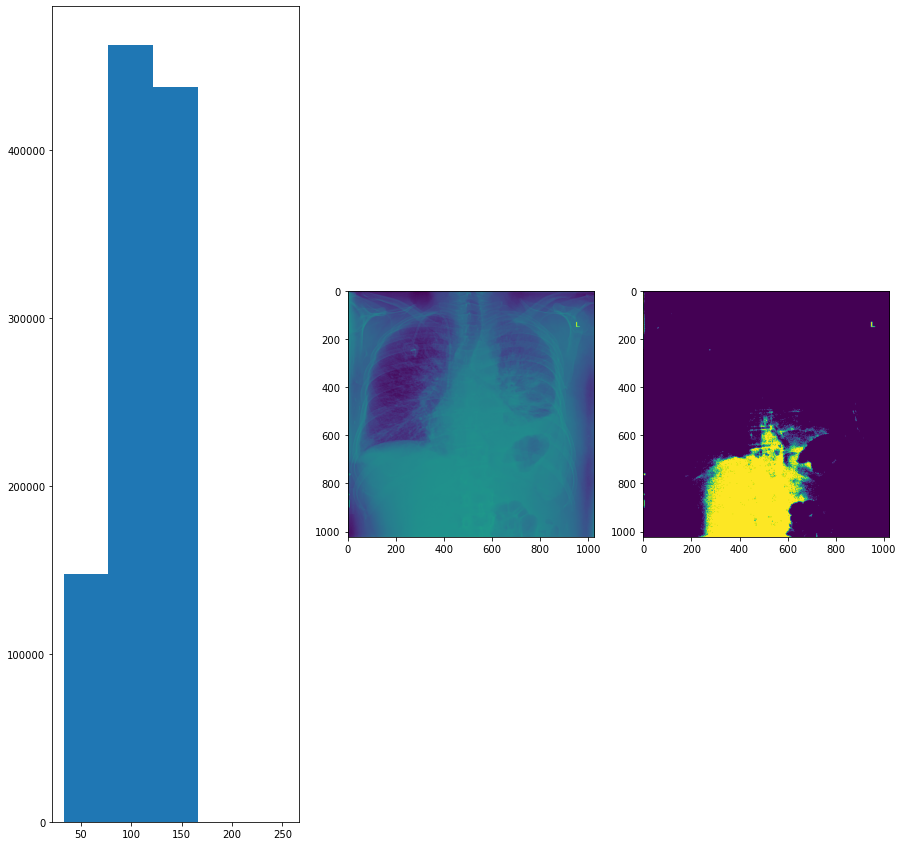

In [56]:
pneumonia_other_intensities,pneumonia_other_intensities_means= plot_and_get_intensities(pneumonia_other_df,threshold)

## 6.3 Histogram of intensity level for healthy patient.

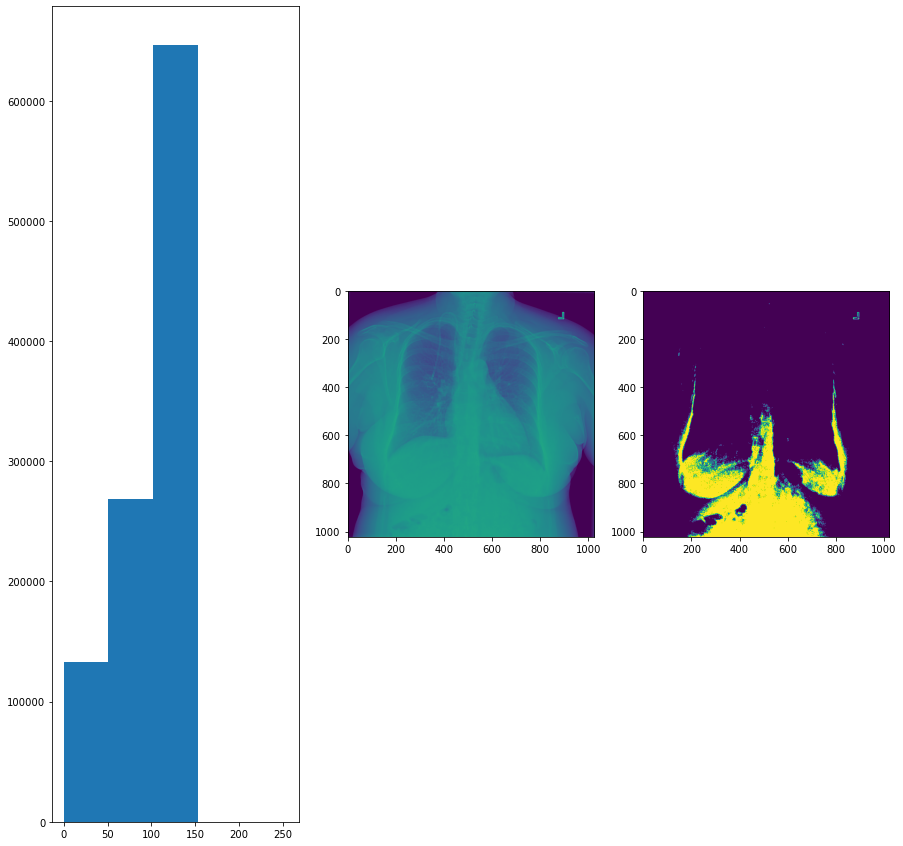

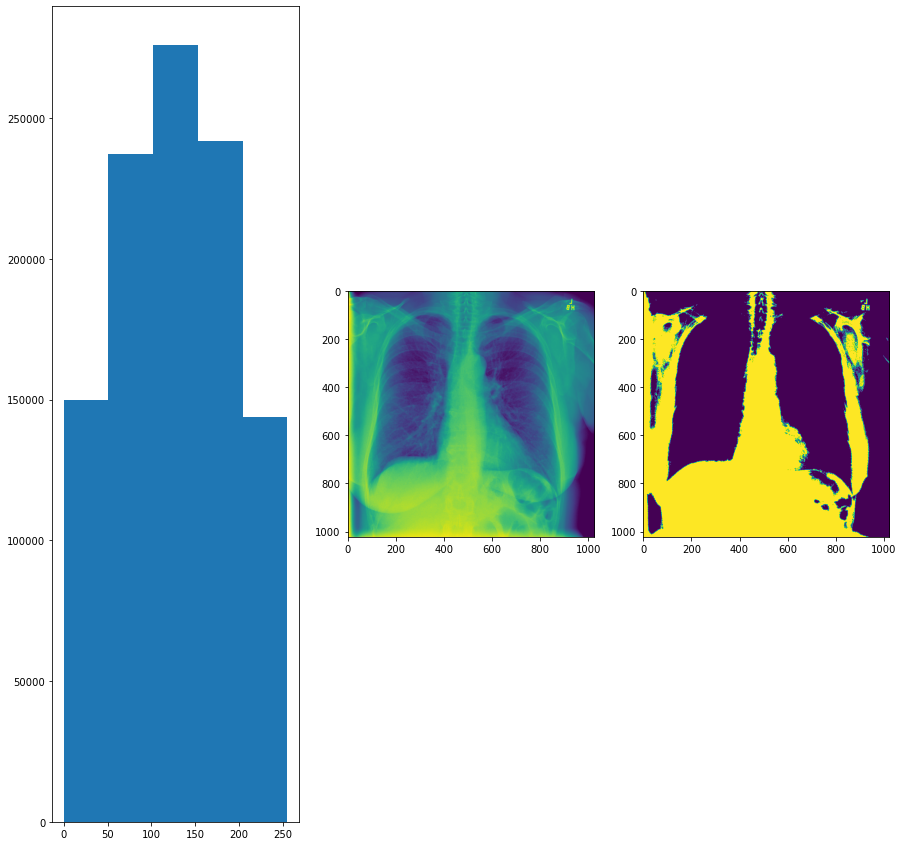

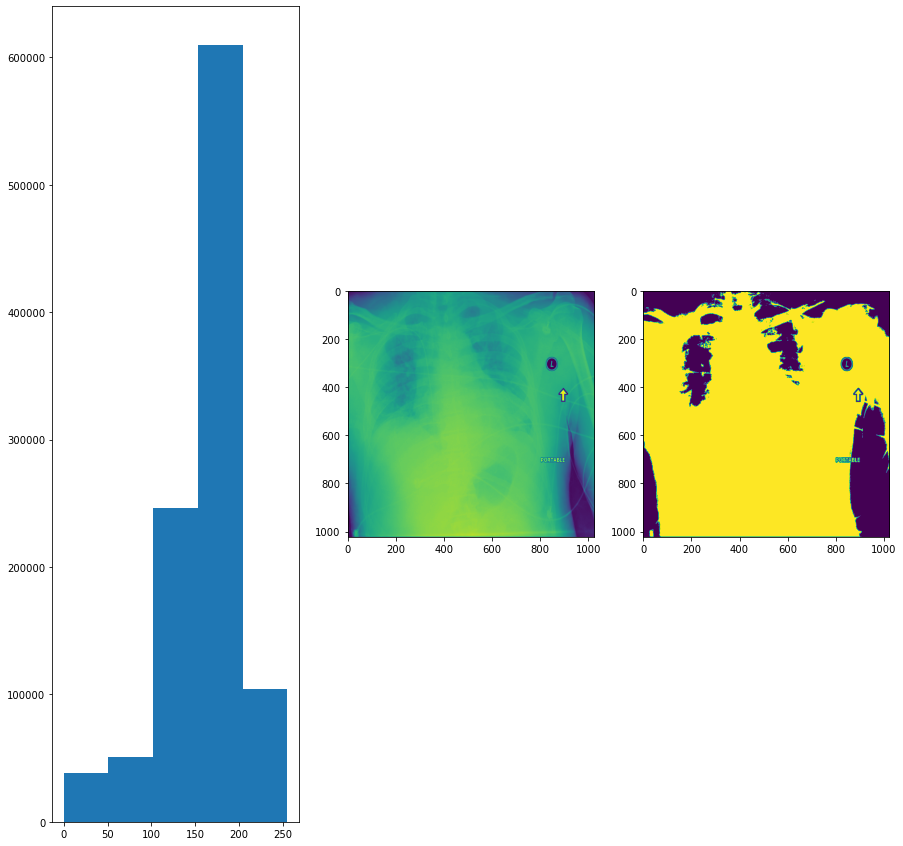

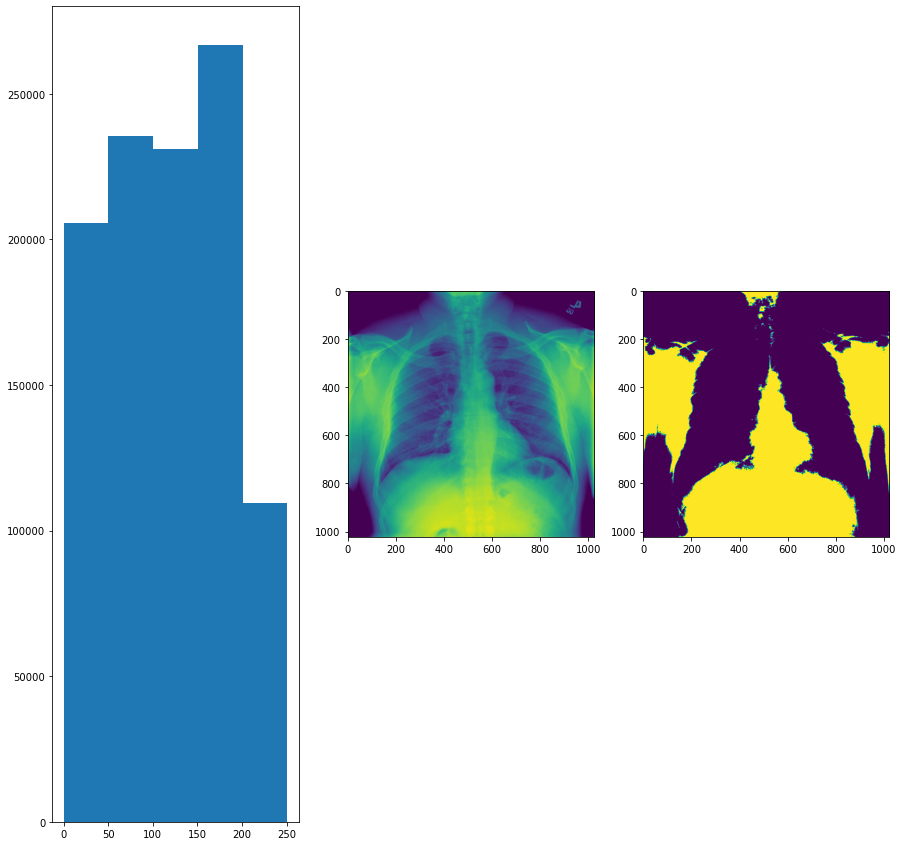

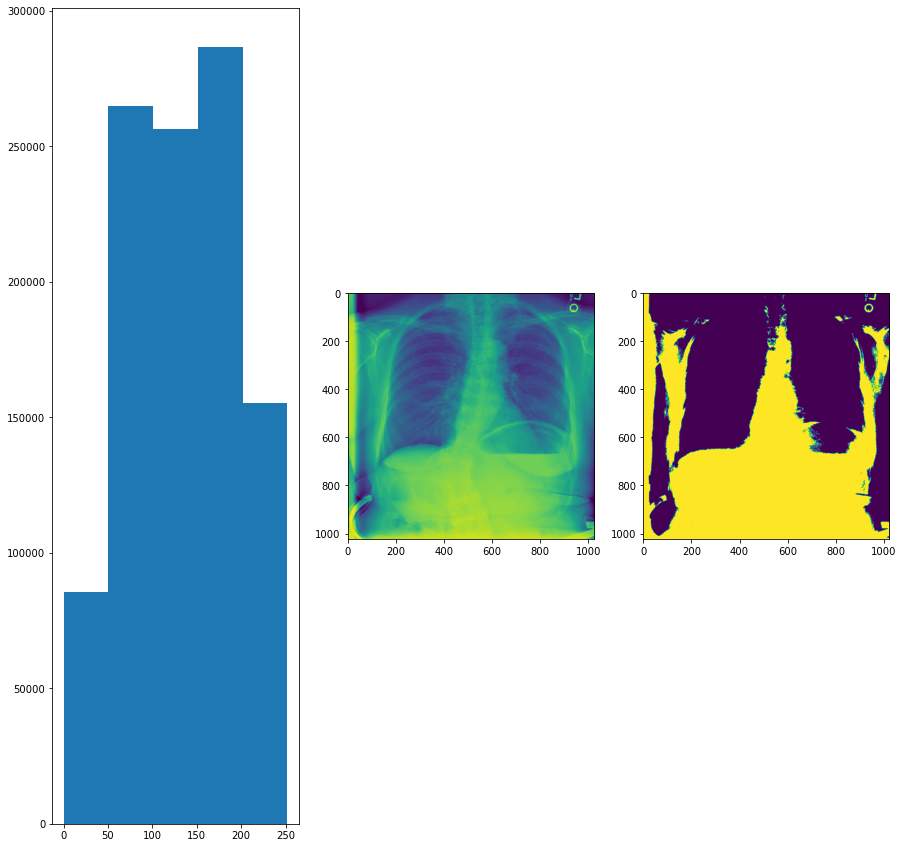

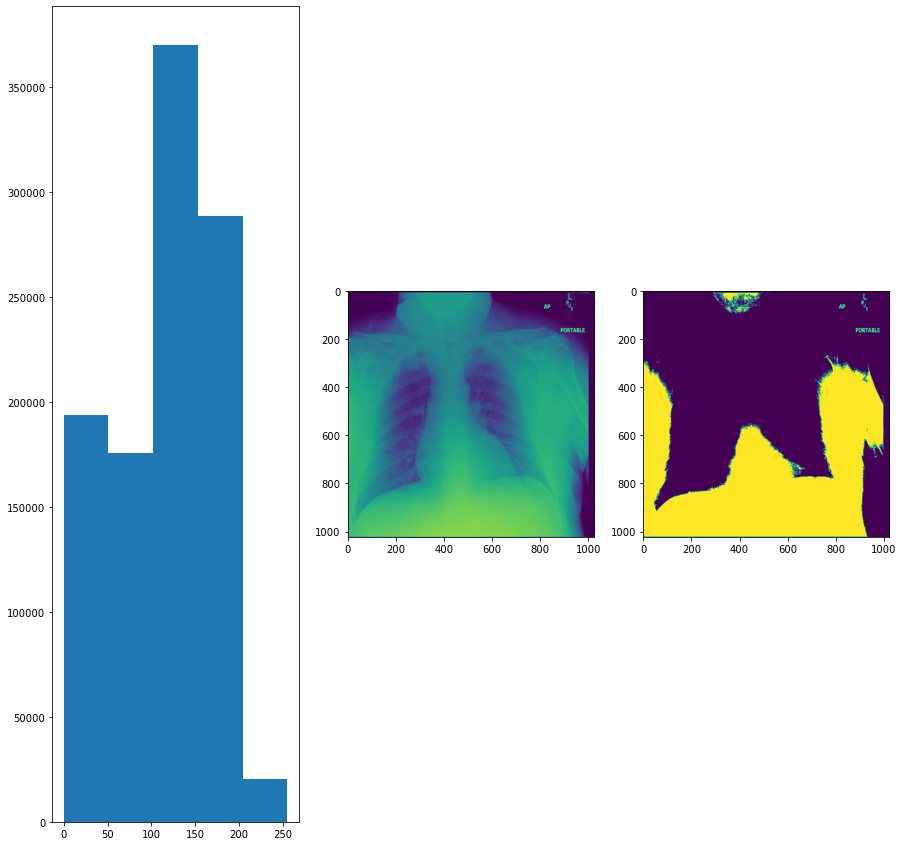

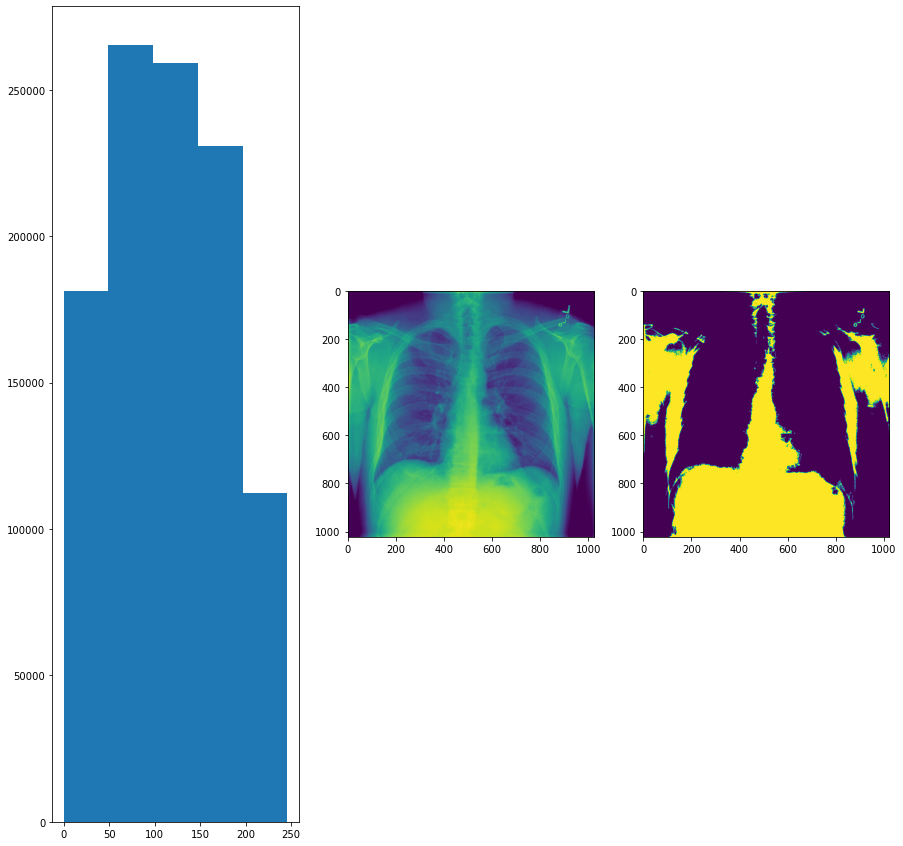

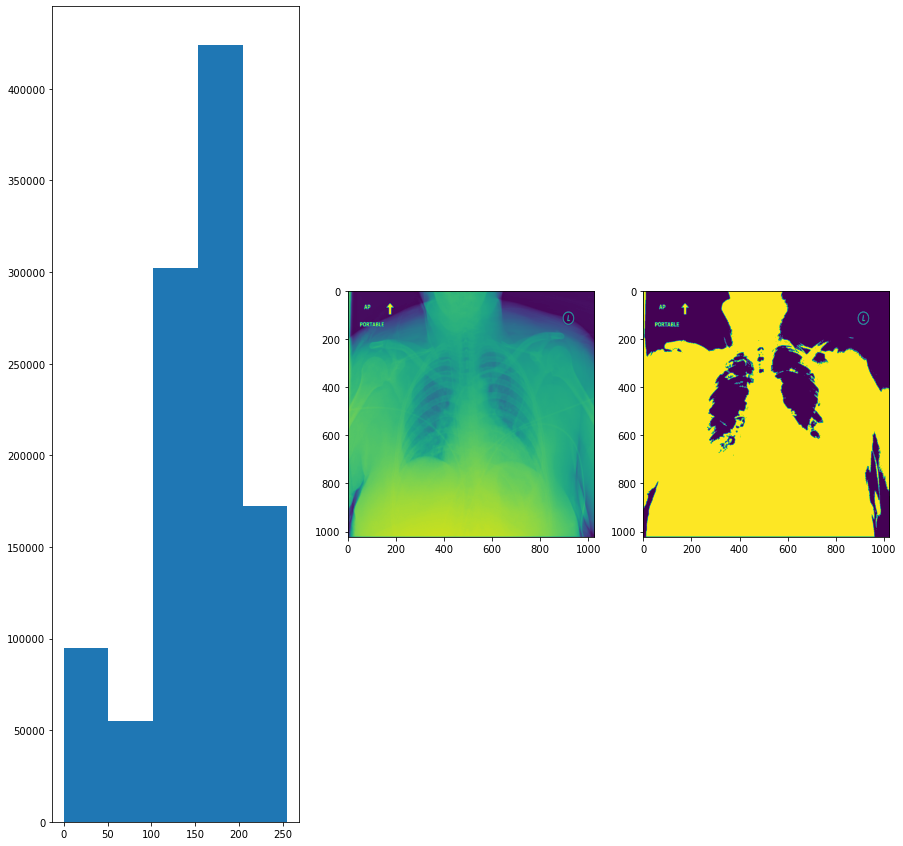

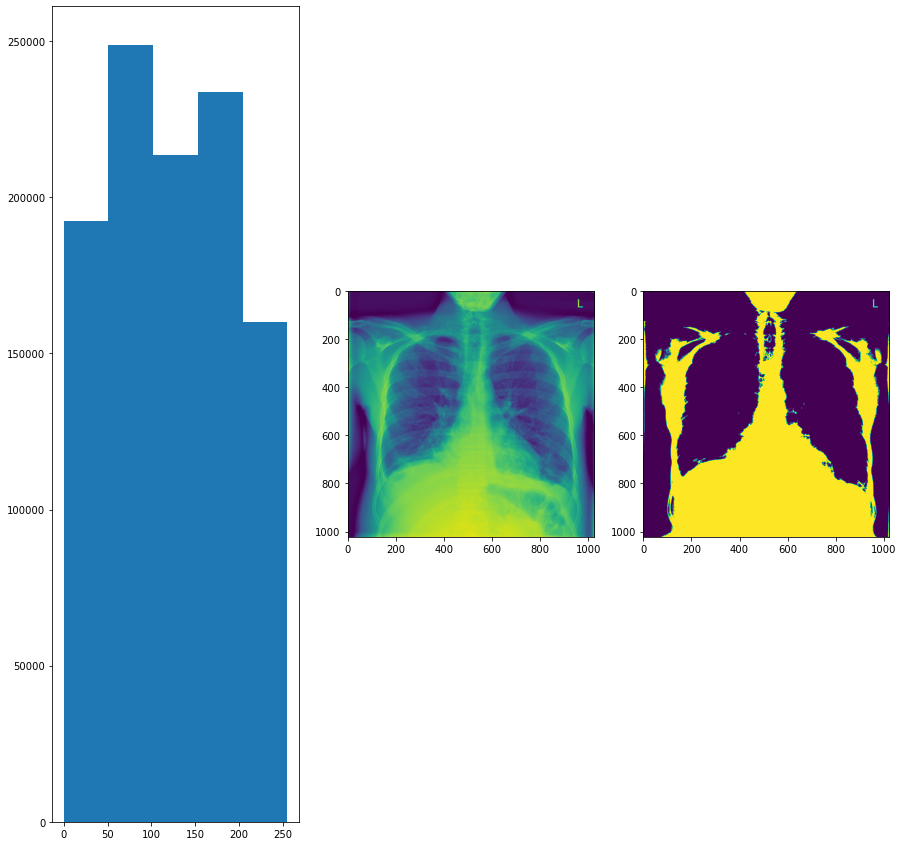

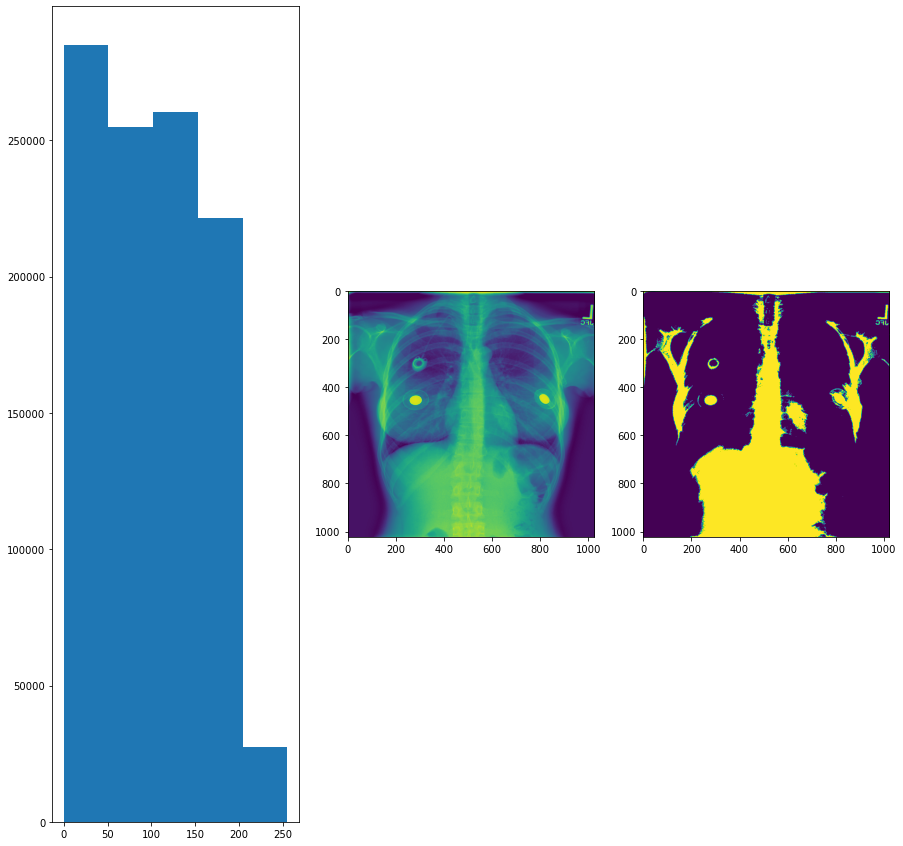

In [57]:
no_decease_intensities,no_decease_intensities_means=plot_and_get_intensities(no_decease_df,threshold)

Text(0.5, 1.0, 'Distribution of pixels for 10 healthy images')

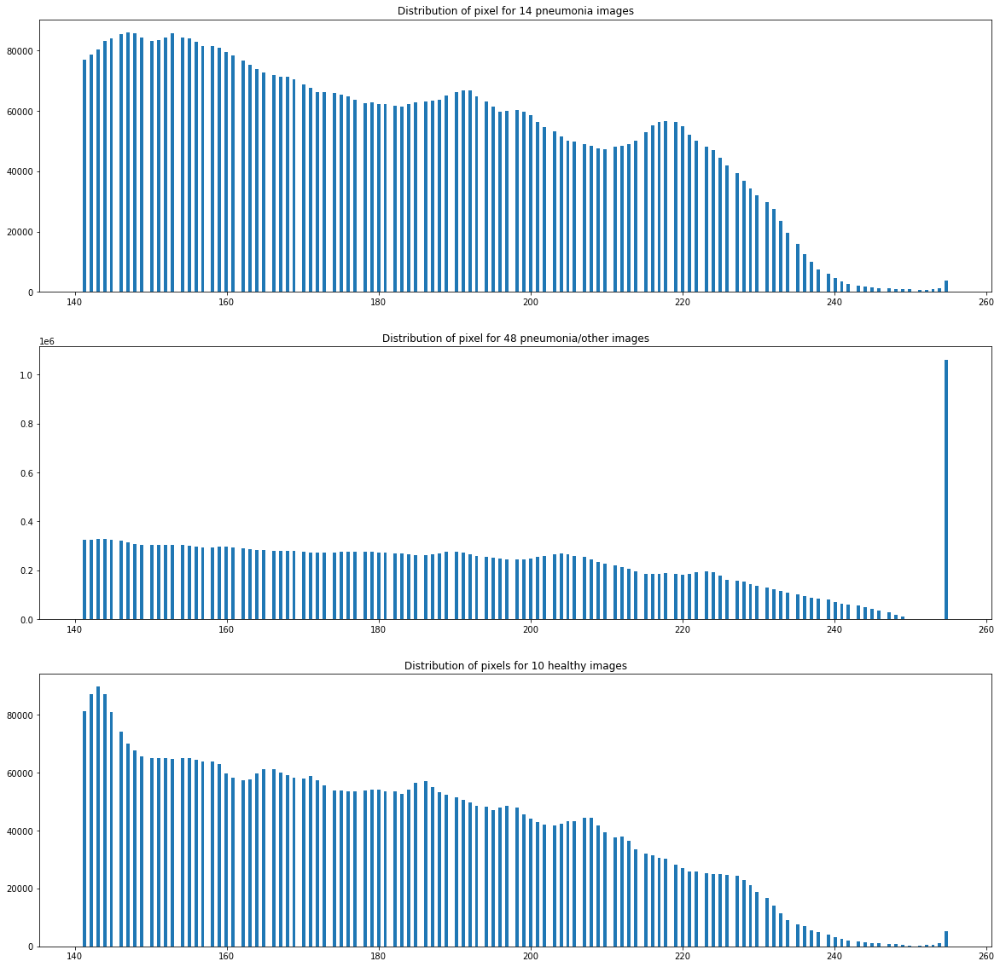

In [58]:
fig, ax = plt.subplots(3,1,figsize=(20,20))        

ax[0].hist(pure_pneumonia_intensities,bins=256)
ax[0].set_title(f'Distribution of pixel for {len(pure_pneumonia_df)} pneumonia images')

ax[1].hist(pneumonia_other_intensities,bins=256)
ax[1].set_title(f'Distribution of pixel for {len(pneumonia_other_df)} pneumonia/other images')

ax[2].hist(no_decease_intensities,bins=256)
ax[2].set_title(f'Distribution of pixels for {len(no_decease_df)} healthy images')


In [59]:
no_decease_intensities_mean = np.mean(no_decease_intensities)
pneumonia_intensities_mean = np.mean(pure_pneumonia_intensities)
pneumonia_other_intensities_mean = np.mean(pneumonia_other_intensities)

#print(f'mean Intensities :\n Pure penumonia: {healthy_intensities_mean}\n Penumonia with other: {pneumonia_other_intensities_mean}\nHealthy case: {no_decease_intensities} ' )

In [60]:
print('Mean Intensities :')
print(f'Pure pneumonia: {pneumonia_intensities_mean}')
print(f'Pneumonia with other: {pneumonia_other_intensities_mean}')
print(f'Healthy case: {no_decease_intensities_mean}')

Mean Intensities :
Pure pneumonia: 181.94703072227216
Pneumonia with other: 187.21296311540948
Healthy case: 179.08912115352248


t-test and KS test between healthy and pure pneumonia cases
t-statistic: -1.1354059474055151 , p-value: 0.26842403856001595
KS-statistic: 0.2571428571428571 ,KS-value: 0.7515734814832945
t-test and KS test between healthy and pneumonia with other deceases case
t-statistic: -0.8410440115804131 , p-value: 0.26842403856001595
KS-statistic: 0.275 ,KS-value: 0.4750093280222999


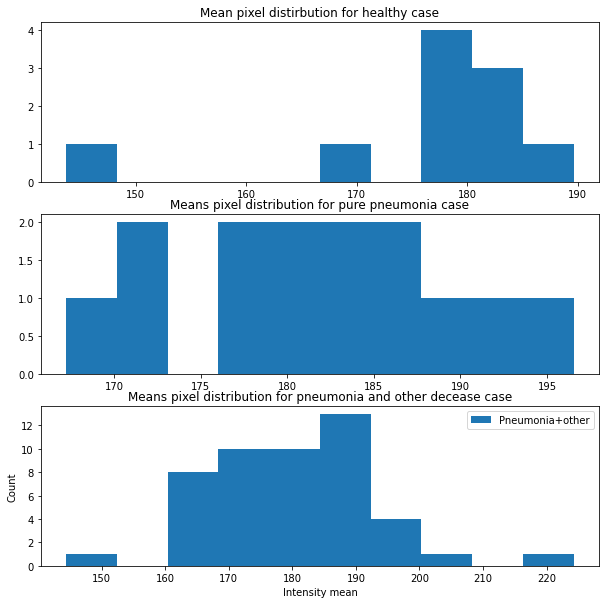

In [67]:
# Compare the distributions of features across healthy and disease states
# This example uses a t-test
t_statistic, p_value = scipy.stats.ttest_ind(no_decease_intensities_means, pure_pneumonia_intensities_means)
ks_statistic,ks_value =scipy.stats.ks_2samp(no_decease_intensities_means, pure_pneumonia_intensities_means)

t2_statistic,p2_value = scipy.stats.ttest_ind(no_decease_intensities_means,pneumonia_other_intensities_means)
ks2_statistic,ks2_value =scipy.stats.ks_2samp(no_decease_intensities_means, pneumonia_other_intensities_means)

                                            
# Print the results
print('t-test and KS test between healthy and pure pneumonia cases')
print(f't-statistic: {t_statistic} , p-value: {p_value}')
print(f'KS-statistic: {ks_statistic} ,KS-value: {ks_value}')
print('t-test and KS test between healthy and pneumonia with other deceases case')
print(f't-statistic: {t2_statistic} , p-value: {p_value}')
print(f'KS-statistic: {ks2_statistic} ,KS-value: {ks2_value}')


# Plot the histograms of intensity values for healthy and disease states
fig , ax = plt.subplots(3,1,figsize= (10,10))
ax[0].hist(no_decease_intensities_means, label='Healthy')
ax[0].set_title('Mean pixel distirbution for healthy case')
ax[1].hist(pure_pneumonia_intensities_means, label='Pure Pneumonia')
ax[1].set_title('Means pixel distribution for pure pneumonia case')
ax[2].hist(pneumonia_other_intensities_means,label='Pneumonia+other')
ax[2].set_title('Means pixel distribution for pneumonia and other decease case')

plt.xlabel('Intensity mean')
plt.ylabel('Count')
plt.legend()
plt.show()

### Not clear differences can be infered betwneen haelthy cases and  pneumonia cases ( with or without other deceases) when lookink at t.test or KS test.